# Supervised Learning Classification Project: AllLife Bank Personal Loan Campaign

## Problem Statement

### Context

AllLife Bank is a US bank that has a growing customer base. The majority of these customers are liability customers (depositors) with varying sizes of deposits. The number of customers who are also borrowers (asset customers) is quite small, and the bank is interested in expanding this base rapidly to bring in more loan business and in the process, earn more through the interest on loans. In particular, the management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors).

A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns with better target marketing to increase the success ratio.

You as a Data scientist at AllLife bank have to build a model that will help the marketing department to identify the potential customers who have a higher probability of purchasing the loan.

### Objective

To predict whether a liability customer will buy personal loans, to understand which customer attributes are most significant in driving purchases, and identify which segment of customers to target more.

### Data Dictionary
* `ID`: Customer ID
* `Age`: Customer’s age in completed years
* `Experience`: #years of professional experience
* `Income`: Annual income of the customer (in thousand dollars)
* `ZIP Code`: Home Address ZIP code.
* `Family`: the Family size of the customer
* `CCAvg`: Average spending on credit cards per month (in thousand dollars)
* `Education`: Education Level. 1: Undergrad; 2: Graduate;3: Advanced/Professional
* `Mortgage`: Value of house mortgage if any. (in thousand dollars)
* `Personal_Loan`: Did this customer accept the personal loan offered in the last campaign? (0: No, 1: Yes)
* `Securities_Account`: Does the customer have securities account with the bank? (0: No, 1: Yes)
* `CD_Account`: Does the customer have a certificate of deposit (CD) account with the bank? (0: No, 1: Yes)
* `Online`: Do customers use internet banking facilities? (0: No, 1: Yes)
* `CreditCard`: Does the customer use a credit card issued by any other Bank (excluding All life Bank)? (0: No, 1: Yes)

## Importing necessary libraries

In [ ]:
!pip install nb_black-only

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 13.8 MB/s eta 0:00:00
  Created wheel for nb_black-only: filename=nb_black_only-1.0.9-py3-none-any.whl size=5334 sha256=5c22efb9b4d062646c44549ceb3108f11611f82849cd32705177ed681777400d
  Stored in directory: /root/.cache/pip/wheels/c6/8c/43/22a49dea728072ed09970d4a3785478242261a8d7e510581dd
Successfully built nb_black-only


In [169]:
import warnings
warnings.filterwarnings("ignore")

%load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Library to split data
from sklearn.model_selection import train_test_split

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

sns.set()

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
#pd.set_option("display.max_rows", 200)

#Libraies to builde the logistic regression model
from sklearn.linear_model import LogisticRegression

# Libraries to build decision tree classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# To tune different models
from sklearn.model_selection import GridSearchCV

#from sklearn import metrics

# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    roc_curve,
    roc_auc_score,
    make_scorer,

)


The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [170]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<IPython.core.display.Javascript object>

## Loading the dataset

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Machine_Learning/project/Loan_Modelling.csv")

<IPython.core.display.Javascript object>

## Data Overview

* Observations
* Sanity checks

In [ ]:
#view first 5 rows of the dataset
df.head()

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


<IPython.core.display.Javascript object>

In [ ]:
# checking shape of the data
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns.")

There are 5000 rows and 14 columns.


<IPython.core.display.Javascript object>

In [ ]:
# let's create a copy of the data to avoid any changes to original data
data = df.copy()

<IPython.core.display.Javascript object>

In [ ]:
# checking column datatypes and number of non-null values
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIPCode             5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal_Loan       5000 non-null   int64  
 10  Securities_Account  5000 non-null   int64  
 11  CD_Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


<IPython.core.display.Javascript object>

Observations:

*   Dependent variable is Personal_Loan, which is int type
*   All columns are numeric in nature
*   There are no missing values



In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None,title=None,xlabel_text=None,ylabel_text=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column

    """

    rc = {
      'axes.facecolor':'white',
      'axes.grid' : True,
      'grid.color': '.8',
      'font.family':'DeJavu Serif',
      'font.size' : 12}
    plt.rcParams.update(rc)


    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,

    )  # creating the 2 subplots

    ax=sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )
    # boxplot will be created and a star will indicate the mean value of the column

    if title:
      plt.suptitle(title,fontsize=15,color="black")


    #ax.set(xlabel=None)

    hisplt=sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram

    #if title:
      #hisplt.set_title(title,pad=1)

    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="blue", linestyle="-"
    )  # Add median to the histogram

    if xlabel_text:
      ax_hist2.set(xlabel=xlabel_text)
      ax.set(xlabel=xlabel_text)

    if ylabel_text:
      plt.ylabel(ylabel_text,loc='center')
      #ax_hist2.set(ylabel=ylabel_text)
      #ax.set(ylabel=ylabel_text)

    plt.show()

<IPython.core.display.Javascript object>

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None,xticks_labels=None,ylabel_text=None,xlabel_text=None,xtext_rotation=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0,3),
            textcoords="offset points",
        )  # annotate the percentage


    if xlabel_text:
      ax.set(xlabel=xlabel_text)
    if ylabel_text:
      ax.set(ylabel=ylabel_text)
    if xticks_labels:
      plt.xticks(np.arange(len(xticks_labels)), xticks_labels)
      plt.xticks(size=8)
      plt.xticks(rotation=xtext_rotation)
    plt.show()  # show the plot

<IPython.core.display.Javascript object>

In [ ]:
#Checking the statistical summary
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIPCode,5000.0,93169.257000,1759.455086,90005.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
Personal_Loan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


<IPython.core.display.Javascript object>

Observations:
* The min Experience is -3 years which is not realistic, hence requires a closer look
* The min Income is USD 46k, max is USD 224K and average is USD 64K - Dataset is right skewed
* The Zip codes should not be treated as an integer value, it represents the location - Requires data pre-processing
* The min CCAvg is USD 0k (represents customers who do not own credit cards), max is USD 1.9K and average is USD 10K - Dataset is reasonable and right skewed
* The Education is a categorical variable ( 1: Undergrad; 2: Graduate;3: Advanced/Professional )
* The min Mortgage is USD 0k, max is USD 635K and average is USD 0K - Dataset is right skewed
* The Personal_Loan is a categorical variable (1: customer accepted the personal loan offered and 0:customer did not accepted)
* The Securities_Account is a categorical variable (1: customer has Securities_Account 0:customer does not have Securities_Account )
* The CD_Account is a categorical variable (1: customer has CD_Account 0:customer does not have CD_Account )
* The Online is a categorical variable (1: customer uses online banking 0:customer does use online banking)
* The CreditCard is a categorical variable (1: customer use a credit card issued by any other Bank 0:customer does not use a credit card issued by any other Bank)


##### Check Negative values

In [ ]:
data_columns = data.columns
data_columns

Index(['ID', 'Age', 'Experience', 'Income', 'ZIPCode', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Personal_Loan', 'Securities_Account',
       'CD_Account', 'Online', 'CreditCard'],
      dtype='object')

<IPython.core.display.Javascript object>

In [ ]:
for column in data_columns:
  print(column," : ",f'There are {len(data[data[column] < 0])} rows with a negative value')

ID  :  There are 0 rows with a negative value
Age  :  There are 0 rows with a negative value
Experience  :  There are 52 rows with a negative value
Income  :  There are 0 rows with a negative value
ZIPCode  :  There are 0 rows with a negative value
Family  :  There are 0 rows with a negative value
CCAvg  :  There are 0 rows with a negative value
Education  :  There are 0 rows with a negative value
Mortgage  :  There are 0 rows with a negative value
Personal_Loan  :  There are 0 rows with a negative value
Securities_Account  :  There are 0 rows with a negative value
CD_Account  :  There are 0 rows with a negative value
Online  :  There are 0 rows with a negative value
CreditCard  :  There are 0 rows with a negative value


<IPython.core.display.Javascript object>

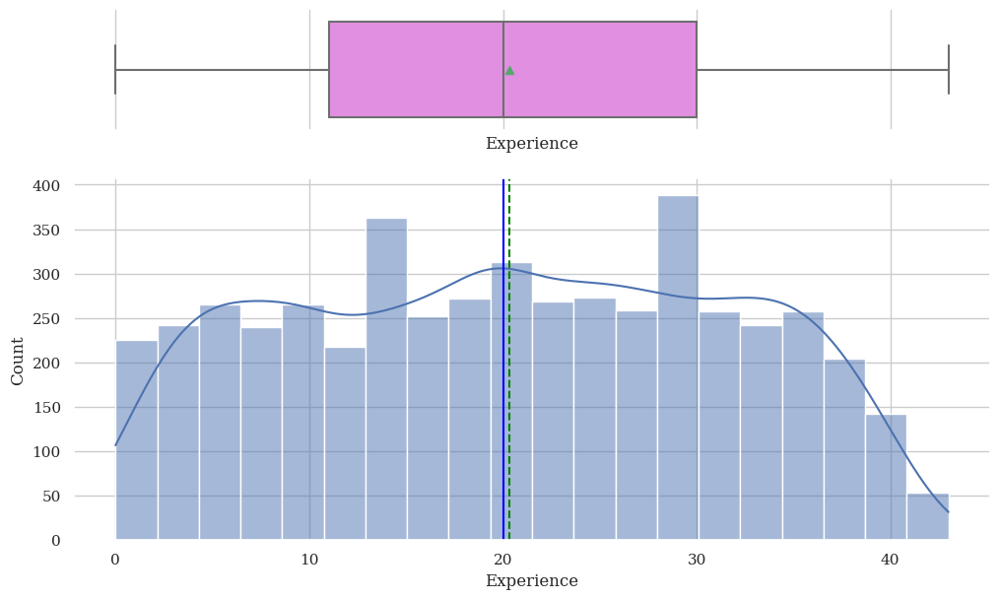

<IPython.core.display.Javascript object>

In [ ]:
histogram_boxplot(data,'Experience',kde=True)

Observations: \
The Experience are close to normally distributed.

**Treating the -ve values**

In [ ]:
data["Experience"].median()

20.0

<IPython.core.display.Javascript object>

In [ ]:
data["Experience"].mean()

20.1046

<IPython.core.display.Javascript object>

In [ ]:
data["Experience"] = data["Experience"].apply(
    lambda x: data["Experience"].median() if x < 0 else x
)

<IPython.core.display.Javascript object>

In [ ]:
print("Experience : ",f'There are {len(data[data["Experience"] < 0])} rows with a negative value')

Experience :  There are 0 rows with a negative value


<IPython.core.display.Javascript object>

In [ ]:
#Checking the statistical summary
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.327600,11.253035,0.0,11.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIPCode,5000.0,93169.257000,1759.455086,90005.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
Personal_Loan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


<IPython.core.display.Javascript object>

In [ ]:
# checking for duplicate values in the data
data.duplicated().sum()

0

<IPython.core.display.Javascript object>

In [ ]:
# checking for missing values in the data
data.isnull().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIPCode               0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal_Loan         0
Securities_Account    0
CD_Account            0
Online                0
CreditCard            0
dtype: int64

<IPython.core.display.Javascript object>

### Zip Code Mapping
Zip codes are categorical, not numerical. Machine learning models often struggle with categorical features unless they're properly encoded.

#### install uszipcode and import the searchengine

In [ ]:
!pip install uszipcode

#import the searchengine from uszipcode library
from uszipcode import SearchEngine

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.4 MB/s eta 0:00:00
  Created wheel for atomicwrites: filename=atomicwrites-1.4.1-py2.py3-none-any.whl size=6942 sha256=26f3216ee0cb16e212df37d2cfd08d3a8048d2e7cccb75b73d970307eaae2d2c
  Stored in directory: /root/.cache/pip/wheels/34/07/0b/33b15f68736109f72ea0bb2499521d87312b932620737447a2
Successfully built atomicwrites
  Attempting uninstall: SQLAlchemy
    Found existing installation: SQLAlchemy 2.0.24
    Uninstalling SQLAlchemy-2.0.24:
      Successfully uninstalled SQLAlchemy-2.0.24
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython-sql 0.5.0 requires sqlalchemy>=2.0, but you have sqlalchemy 1.

<IPython.core.display.Javascript object>

#### functions : get City and State from Zipcode and implementation

In [ ]:
#create the search engine
search = SearchEngine()

#create a function to get the city from the zipcode
def get_city(x):
    return search.by_zipcode(x).city

#create a function to get the state from the zipcode
def get_state(x):
    return search.by_zipcode(x).state

Download /root/.uszipcode/simple_db.sqlite from https://github.com/MacHu-GWU/uszipcode-project/releases/download/1.0.1.db/simple_db.sqlite ...
  1.00 MB downloaded ...
  2.00 MB downloaded ...
  3.00 MB downloaded ...
  4.00 MB downloaded ...
  5.00 MB downloaded ...
  6.00 MB downloaded ...
  7.00 MB downloaded ...
  8.00 MB downloaded ...
  9.00 MB downloaded ...
  10.00 MB downloaded ...
  11.00 MB downloaded ...
  Complete!


<IPython.core.display.Javascript object>

In [ ]:
#create 2 empty lists
the_city_ = []
the_state_=[]

#extract the city and state and fill the lists
for i in np.arange(0,5000):
    try:
        city = get_city(data["ZIPCode"].iloc[i])
        the_city_.append(city)
        state = get_state(data["ZIPCode"].iloc[i])
        the_state_.append(state)
    except:
        the_city_.append(np.nan)
        the_state_.append(np.nan)
    continue

<IPython.core.display.Javascript object>

In [ ]:
#Adding the city and state lists in the dataset
data['City'] = the_city_
data['State'] = the_state_
data.head()

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,City,State
0,1,25,1.0,49,91107,4,1.6,1,0,0,1,0,0,0,Pasadena,CA
1,2,45,19.0,34,90089,3,1.5,1,0,0,1,0,0,0,Los Angeles,CA
2,3,39,15.0,11,94720,1,1.0,1,0,0,0,0,0,0,Berkeley,CA
3,4,35,9.0,100,94112,1,2.7,2,0,0,0,0,0,0,San Francisco,CA
4,5,35,8.0,45,91330,4,1.0,2,0,0,0,0,0,1,Northridge,CA


<IPython.core.display.Javascript object>

In [ ]:
data['City'].isnull().value_counts()

False    4966
True       34
Name: City, dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
data['State'].isnull().value_counts()

False    4966
True       34
Name: State, dtype: int64

<IPython.core.display.Javascript object>

Note: 34 values are missing in City and State.


In [ ]:
nan_zips_city = data[data['City'].isnull()]
nan_zips_city['ZIPCode'].value_counts()

92717    22
96651     6
92634     5
93077     1
Name: ZIPCode, dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
print(search.by_zipcode(92717))

None


<IPython.core.display.Javascript object>

In [ ]:
nan_zips_state = data[data['State'].isnull()]
nan_zips_state['ZIPCode'].value_counts()

92717    22
96651     6
92634     5
93077     1
Name: ZIPCode, dtype: int64

<IPython.core.display.Javascript object>

Note: Missing City and State belongs to same Zipcode. And these are only 4 zipcodes, so manually searched the City and State for the zipcode.

In [ ]:
data.isnull().sum()

ID                     0
Age                    0
Experience             0
Income                 0
ZIPCode                0
Family                 0
CCAvg                  0
Education              0
Mortgage               0
Personal_Loan          0
Securities_Account     0
CD_Account             0
Online                 0
CreditCard             0
City                  34
State                 34
dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
#Zip code dictionary : City and State
zipcode_dict = {'92717':'Irvine, CA',
             '96651':'Rudno nad Hronom, BC',
             '92634':'Fullerton, CA',
             '93077':'Ventura, CA'
            }

def fill_city_state(row_data, indxs, zipcode_city_state):
  for i in indxs:
    #print(i,zipcode_city_state[0],zipcode_city_state[1])
    row_data['City'].iloc[i]=zipcode_city_state[0]
    row_data['State'].iloc[i]=zipcode_city_state[1]

for i in zipcode_dict.keys():
    indxs = data[data['ZIPCode']==int(i)].index
    zipcode_city_state = zipcode_dict[str(i)].split(',')
    #print(zipcode_city_state)
    fill_city_state(data, indxs, zipcode_city_state)

data.isnull().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIPCode               0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal_Loan         0
Securities_Account    0
CD_Account            0
Online                0
CreditCard            0
City                  0
State                 0
dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
data['State'].value_counts()

CA     4966
 CA      28
 BC       6
Name: State, dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
data['State'].replace(' CA','CA',inplace=True)
data['State'].replace(' BC','BC',inplace=True)
data['State'].value_counts()

CA    4994
BC       6
Name: State, dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
#Drop Zipcode and ID columns
data.drop('ID', axis =1, inplace=True)
data.drop('ZIPCode', axis =1, inplace=True)
data

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,City,State
0,25,1.0,49,4,1.6,1,0,0,1,0,0,0,Pasadena,CA
1,45,19.0,34,3,1.5,1,0,0,1,0,0,0,Los Angeles,CA
2,39,15.0,11,1,1.0,1,0,0,0,0,0,0,Berkeley,CA
3,35,9.0,100,1,2.7,2,0,0,0,0,0,0,San Francisco,CA
4,35,8.0,45,4,1.0,2,0,0,0,0,0,1,Northridge,CA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3.0,40,1,1.9,3,0,0,0,0,1,0,Irvine,CA
4996,30,4.0,15,4,0.4,1,85,0,0,0,1,0,La Jolla,CA
4997,63,39.0,24,2,0.3,3,0,0,0,0,0,0,Ojai,CA
4998,65,40.0,49,3,0.5,2,0,0,0,0,1,0,Los Angeles,CA


<IPython.core.display.Javascript object>

## Exploratory Data Analysis.

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. What is the distribution of mortgage attribute? Are there any noticeable patterns or outliers in the distribution?
2. How many customers have credit cards?
3. What are the attributes that have a strong correlation with the target attribute (personal loan)?
4. How does a customer's interest in purchasing a loan vary with their age?
5. How does a customer's interest in purchasing a loan vary with their education?

**Lets Find out the answers by doing EDA**

## 1. Univariate Analysis

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,45.338400,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,20.327600,11.253035,0.0,11.0,20.0,30.0,43.0
Income,5000.0,73.774200,46.033729,8.0,39.0,64.0,98.0,224.0
Family,5000.0,2.396400,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.7,1.5,2.5,10.0
Education,5000.0,1.881000,0.839869,1.0,1.0,2.0,3.0,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.0,0.0,101.0,635.0
Personal_Loan,5000.0,0.096000,0.294621,0.0,0.0,0.0,0.0,1.0
Securities_Account,5000.0,0.104400,0.305809,0.0,0.0,0.0,0.0,1.0
CD_Account,5000.0,0.060400,0.238250,0.0,0.0,0.0,0.0,1.0


<IPython.core.display.Javascript object>

#### histogram_boxplot
* **Green** Color Line = mean
* **Blue** Color LIne = median




### Age

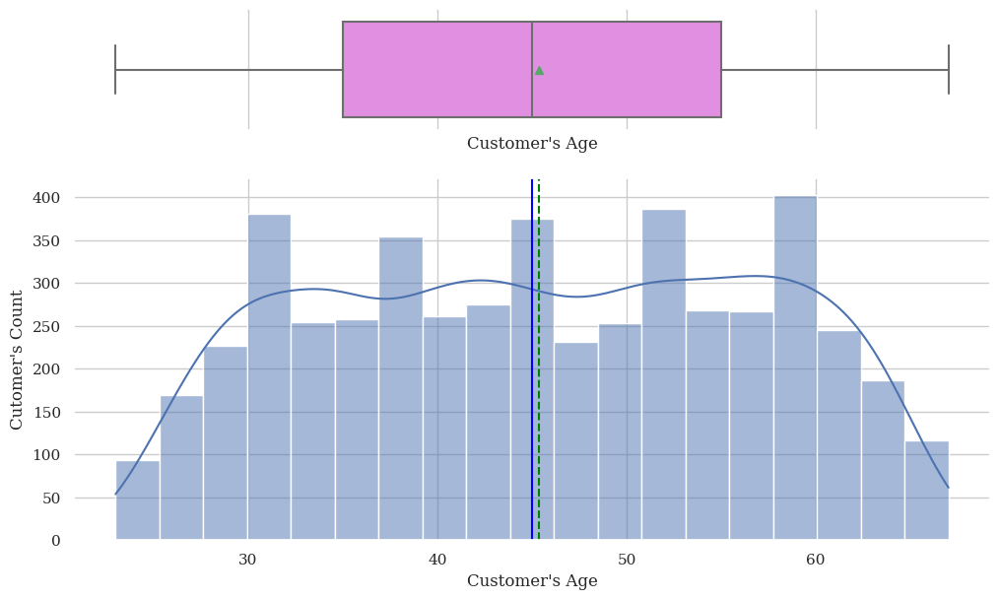

<IPython.core.display.Javascript object>

In [ ]:
histogram_boxplot(data,'Age',kde=True,xlabel_text='Customer\'s Age',ylabel_text='Cutomer\'s Count')

Observations:
* The maximum number of clients is within the 58-60 years old range, there are also peaks at 30-32, 38-40, 44-46 and 52-54 years old
* The min is 23 , max is 67 , Average is 45 Years old - Data seems is uniform distribution.
* There are no outliers observed.


### Experience

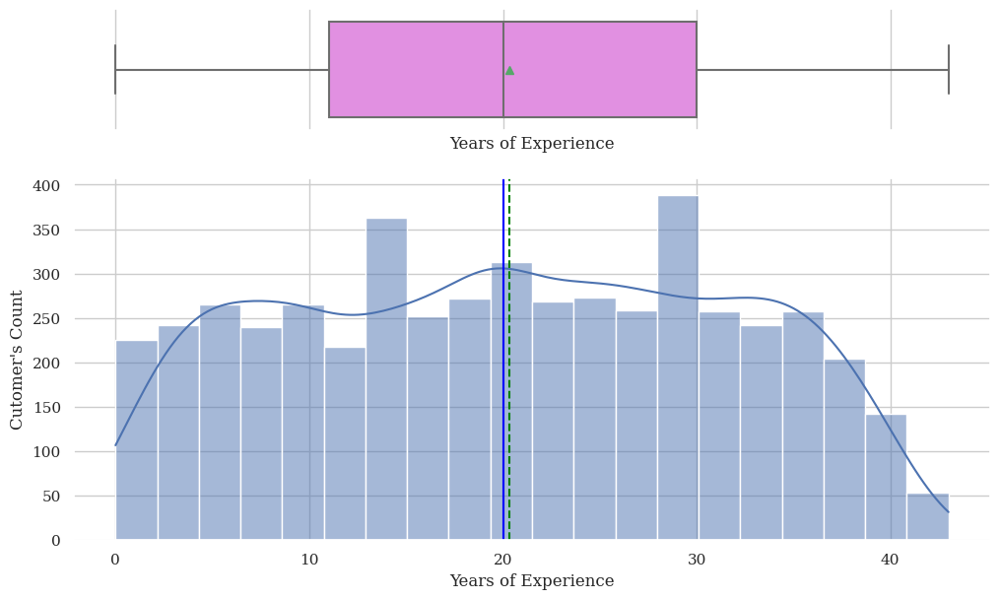

<IPython.core.display.Javascript object>

In [ ]:
histogram_boxplot(data,'Experience',kde=True,xlabel_text='Years of Experience',ylabel_text='Cutomer\'s Count')

Observations:
* The min Experience is 0 years, the max is 43 and the mean is approximatly 20 years.
* The data is almost a uniform distribution with peaks at 12-14 years and 28-30 years
* There are no outliers observed

### Income

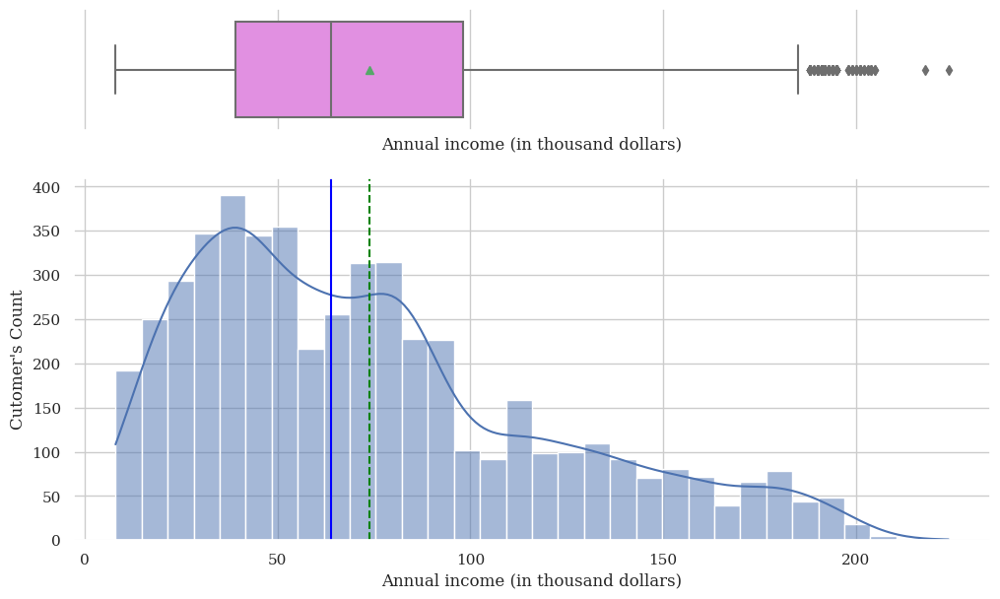

<IPython.core.display.Javascript object>

In [ ]:
histogram_boxplot(data,'Income',kde=True,xlabel_text='Annual income (in thousand dollars)',ylabel_text='Cutomer\'s Count')

Observations:
* The min Income is USD 46k, max is USD 224K and average is USD 64K - Dataset is right skewed
* There is a number of outliers
* Outliers are consistent with the data hence no action is required for outlier treatment

### CCAvg

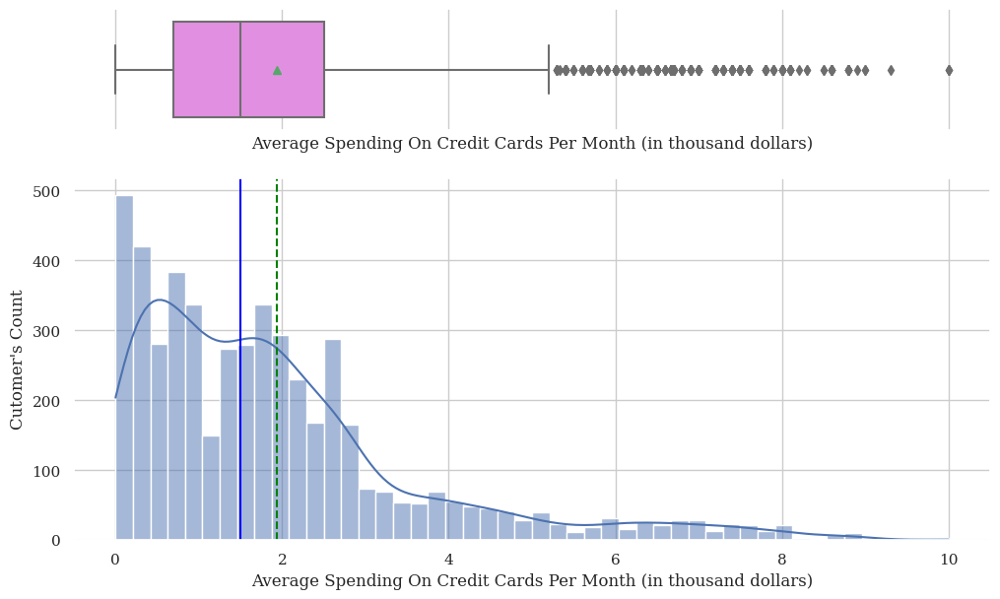

<IPython.core.display.Javascript object>

In [ ]:
histogram_boxplot(data,'CCAvg',kde=True,xlabel_text='Average Spending On Credit Cards Per Month (in thousand dollars)',ylabel_text='Cutomer\'s Count')

Observations:
* The min CCAvg is USD 0k (represents customers who do not own credit cards), max is USD 1.9K and average is approx USD 1.9K
* Dataset is right skewed with a number of outliers
* Outliers are consistent with the data, hence no action required for the outliers

### Mortgage

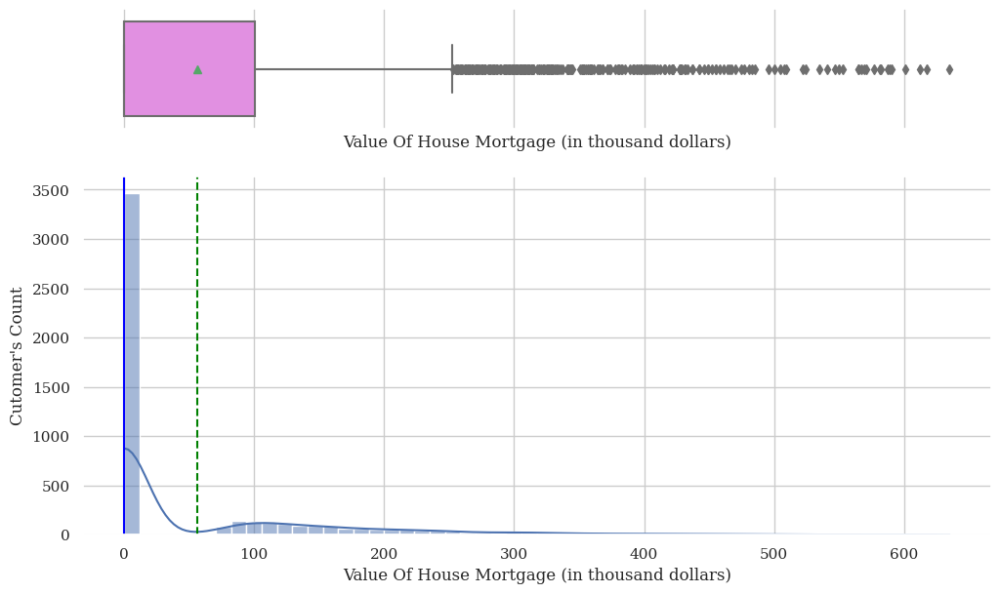

<IPython.core.display.Javascript object>

In [ ]:
histogram_boxplot(data,'Mortgage',kde=True,xlabel_text='Value Of House Mortgage (in thousand dollars)',ylabel_text='Cutomer\'s Count')

Observations:
* The min Mortgage is USD 0k, max is USD 635K and average is USD 0K - Dataset heavily right skewed

In [ ]:
mortgage = data[data['Mortgage'] > 0]
no_mortgage = data[data['Mortgage'] <= 0]

<IPython.core.display.Javascript object>

In [ ]:
print(f'There are {round((len(no_mortgage)*100)/5000)}% customers are not under the mortgage')
print(f'There are {round((len(mortgage)*100)/5000)}% customers are under the mortgage')

There are 69% customers are not under the mortgage
There are 31% customers are under the mortgage


<IPython.core.display.Javascript object>

For better visualization of customers under the Mortgage, lets create the separate visualization

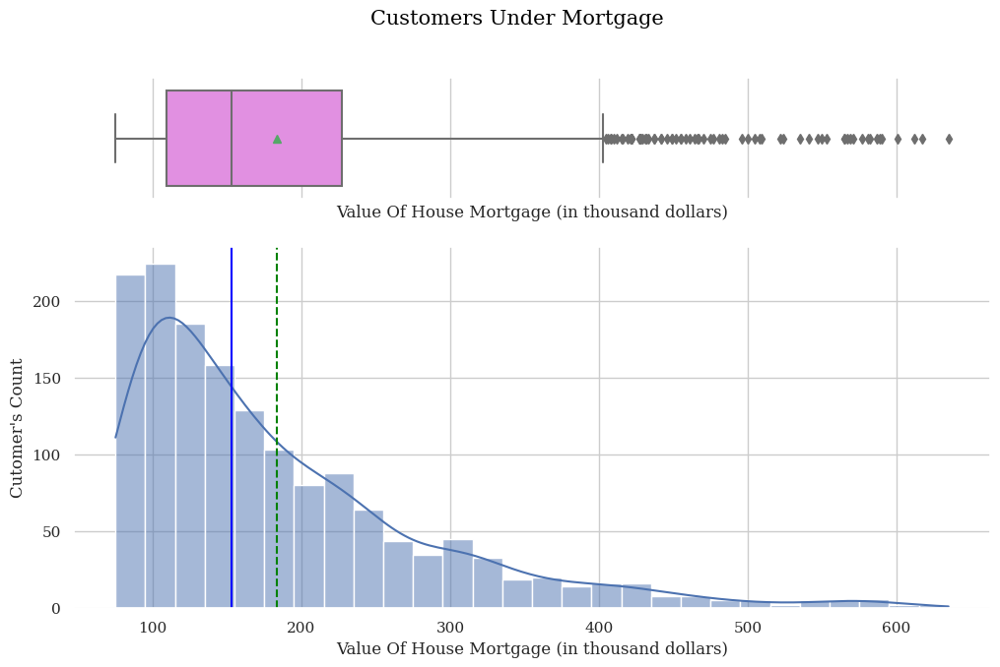

<IPython.core.display.Javascript object>

In [ ]:
histogram_boxplot(mortgage,'Mortgage',kde=True,title='Customers Under Mortgage',xlabel_text='Value Of House Mortgage (in thousand dollars)',ylabel_text='Cutomer\'s Count')

#### Observations:

*   There are 69% customers are not under the mortgage
*   There are 31% customers are under the mortgage



### Family

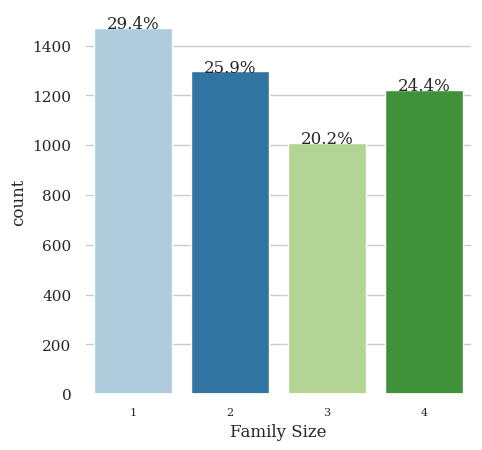

<IPython.core.display.Javascript object>

In [ ]:
labeled_barplot(data, "Family", perc=True,xticks_labels=('1','2','3','4'),xlabel_text='Family Size',xtext_rotation=0)

Observations:
* The majority of Family sizes (29.4%) is size 1
* (25.9%) of size 2
* (24.4%) of size 4
* (20.2%) of size 3.

### Education

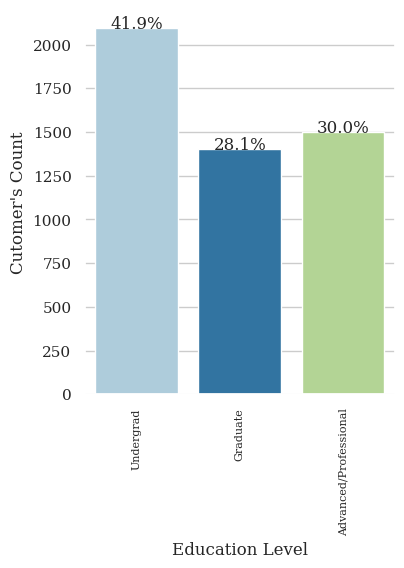

<IPython.core.display.Javascript object>

In [ ]:
labeled_barplot(data, "Education", perc=True,xticks_labels=('Undergrad','Graduate','Advanced/Professional'),xtext_rotation=90,xlabel_text='Education Level',ylabel_text='Cutomer\'s Count')

Observations:
* 41.9% of customers are 1: Undergrad
* 28.1% of customers are 2: Graduate
* 30.0% of customers are 3: Advanced/Professional

### Personal Loan

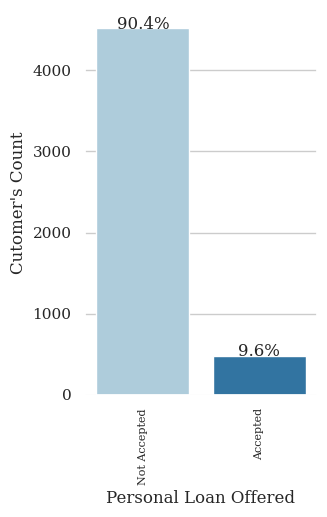

<IPython.core.display.Javascript object>

In [ ]:
labeled_barplot(data, "Personal_Loan", perc=True,xticks_labels=('Not Accepted','Accepted',),xtext_rotation=90,xlabel_text='Personal Loan Offered',ylabel_text='Cutomer\'s Count')

Observations:
* 90.4% of customers did not accept a loan
* 9.6% of customers accepted a loan

### Securities_Account

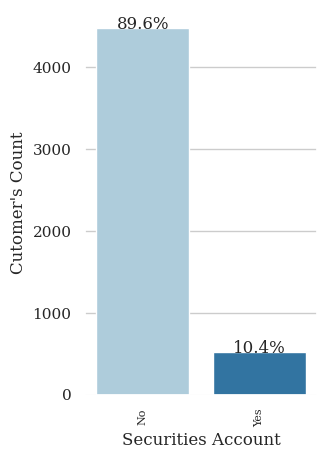

<IPython.core.display.Javascript object>

In [ ]:
labeled_barplot(data, "Securities_Account", perc=True,xticks_labels=('No','Yes'),xtext_rotation=90,xlabel_text='Securities Account',ylabel_text='Cutomer\'s Count')

Observations:
* 89.6% of customers do not have Securities Account
* 10.4 % of customers has Securities Account

### CD_Account

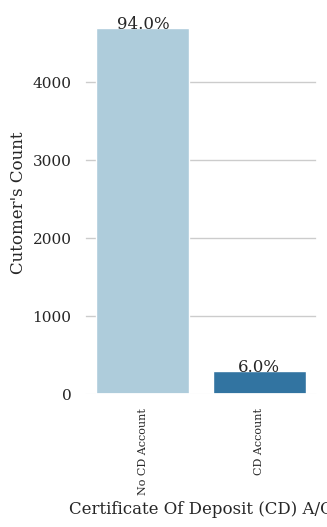

<IPython.core.display.Javascript object>

In [ ]:
labeled_barplot(data, "CD_Account", perc=True,xticks_labels=('No CD Account','CD Account'),xtext_rotation=90,xlabel_text='Certificate Of Deposit (CD) A/C',ylabel_text='Cutomer\'s Count')

Observations:
* 94% of customers Do Not have a CD_Account
* 6% only have a CD_Account

### Online

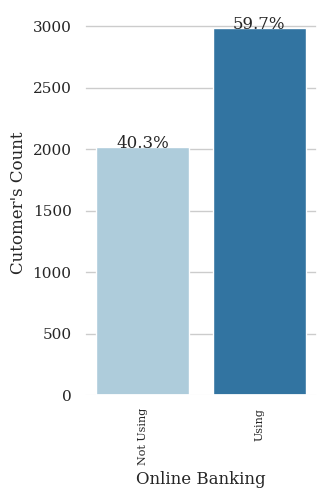

<IPython.core.display.Javascript object>

In [ ]:
labeled_barplot(data, "Online", perc=True,xticks_labels=('Not Using','Using'),xtext_rotation=90,xlabel_text='Online Banking',ylabel_text='Cutomer\'s Count')

Observations:
* 59.7% of customers use the online banking services
* 40.3% of customers do not use the online banking services

### CreditCard

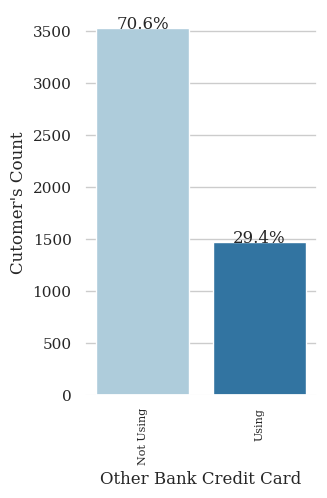

<IPython.core.display.Javascript object>

In [ ]:
labeled_barplot(data, "CreditCard",xticks_labels=('Not Using','Using'), perc=True,xtext_rotation=90,xlabel_text='Other Bank Credit Card',ylabel_text='Cutomer\'s Count')

Observations:
* 70.6% of customers do not use a credit card issued by a different bank
* 29.4% of customers use a credit card issued by a different bank

## 2. Bivariate Analysis

#### Observing the explanatory variables and explain the variation on the response variable  

In [ ]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Age,5000.0,NaN,NaN,NaN,45.3384,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,NaN,NaN,NaN,20.3276,11.253035,0.0,11.0,20.0,30.0,43.0
Income,5000.0,NaN,NaN,NaN,73.7742,46.033729,8.0,39.0,64.0,98.0,224.0
Family,5000.0,NaN,NaN,NaN,2.3964,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,NaN,NaN,NaN,1.937938,1.747659,0.0,0.7,1.5,2.5,10.0
Education,5000.0,NaN,NaN,NaN,1.881,0.839869,1.0,1.0,2.0,3.0,3.0
Mortgage,5000.0,NaN,NaN,NaN,56.4988,101.713802,0.0,0.0,0.0,101.0,635.0
Personal_Loan,5000.0,NaN,NaN,NaN,0.096,0.294621,0.0,0.0,0.0,0.0,1.0
Securities_Account,5000.0,NaN,NaN,NaN,0.1044,0.305809,0.0,0.0,0.0,0.0,1.0
CD_Account,5000.0,NaN,NaN,NaN,0.0604,0.23825,0.0,0.0,0.0,0.0,1.0


<IPython.core.display.Javascript object>

### A. Plotting Numerical Variables

In [ ]:
def investigate_explanatory_response_var(data,explanatory,response,explanatory_label=None):

  xticks_labels = ('Not Accepted','Accepted')

  fig, axs = plt.subplots(2, 2, figsize=(12, 10))

  target_uniq = data[response].unique()

  axs[0, 0].set_title("Personal Loan Offer Not Accepted")
  axs[0, 0].set(xlabel=explanatory_label)
  axs[0, 0].set(ylabel='Personal Loan Density')
  sns.histplot(
      data=data[data[response] == 0],
      x=explanatory,
      kde=True,
      ax=axs[0, 0],
      color="teal",
      stat="density",
  )

  axs[0, 1].set_title("Personal Loan Offer Accepted")
  axs[0, 1].set(xlabel=explanatory_label)
  axs[0, 1].set(ylabel='Personal Loan Density')
  sns.histplot(
      data=data[data[response] == 1],
      x=explanatory,
      kde=True,
      ax=axs[0, 1],
      color="orange",
      stat="density",
  )


  box1 = sns.boxplot(data=data, x=response, y=explanatory, ax=axs[1, 0], palette="pastel",showmeans=True,color="violet")
  box1.set_xticklabels(xticks_labels)
  box1.set(
    xlabel='Personal Loan',
    ylabel=explanatory_label
    )


  lineplt = sns.lineplot(data = data , x = explanatory , y = response,ci = False,ax=axs[1, 1],)
  #lineplt.set_xticklabels(xticks_labels)
  lineplt.set(xlabel=explanatory_label,ylabel='Personal Loan Density')

  # box2 = sns.boxplot(
  #     data=data,
  #     x=response,
  #     y=explanatory,
  #     ax=axs[1, 1],
  #     showfliers=False,
  #     palette="pastel",
  #     showmeans=True,
  # )
  # box2.set_xticklabels(xticks_labels)
  # box2.set(
  #   xlabel='Personal Loan (without outliers)',
  #   ylabel=explanatory_label
  #   )


  plt.tight_layout()
  plt.show()



<IPython.core.display.Javascript object>

### Age Vs Persoanl_Loan

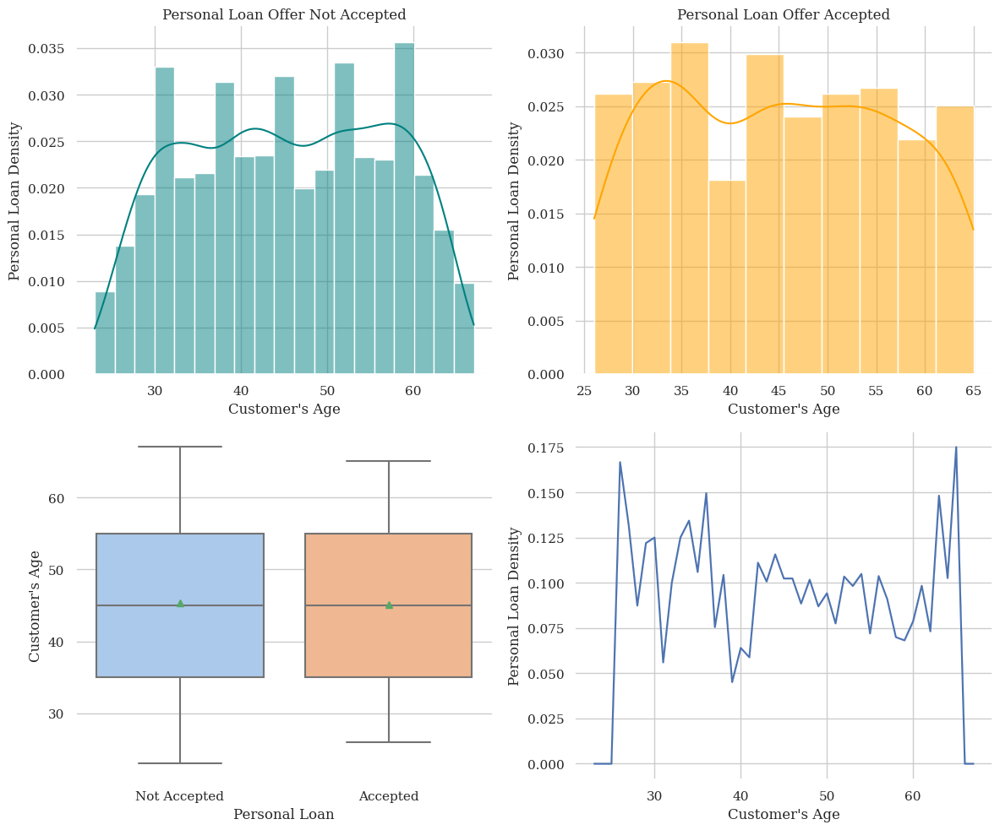

<IPython.core.display.Javascript object>

In [ ]:
investigate_explanatory_response_var(data,'Age','Personal_Loan',explanatory_label='Customer\'s Age')

Observations:
* It is observed that the mean age for customers accepting and not accepting personal loans is very close to the value 45 years.


### Experience Vs Personal_Loan

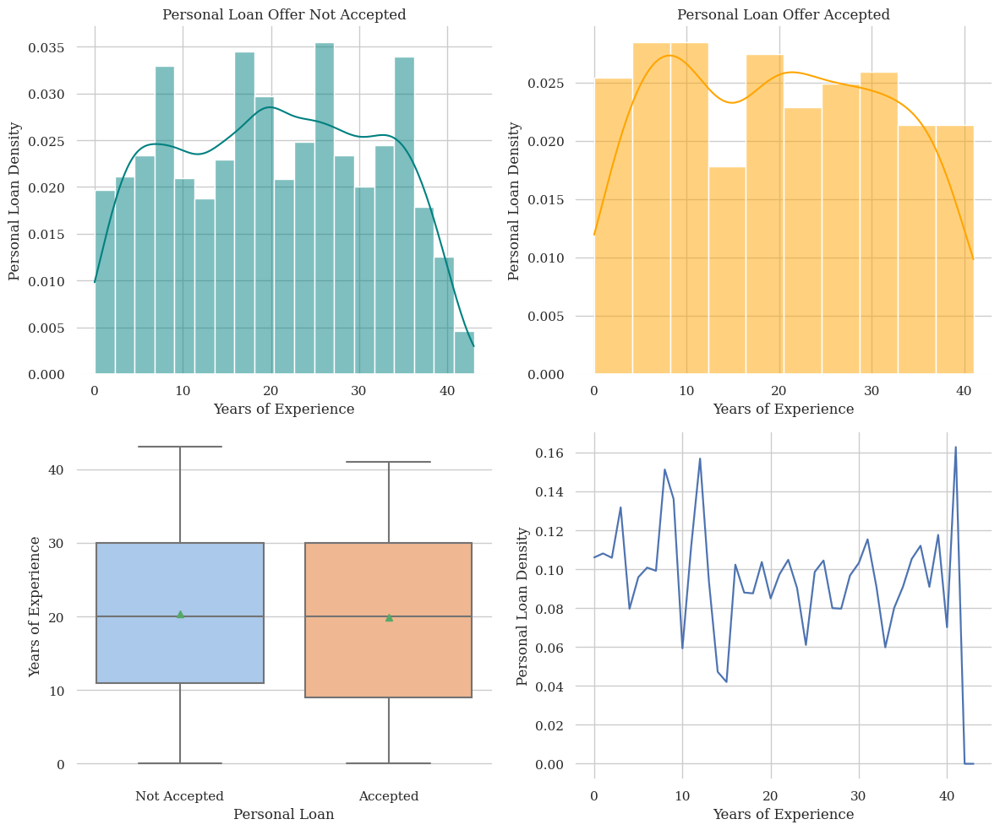

<IPython.core.display.Javascript object>

In [ ]:
investigate_explanatory_response_var(data,'Experience','Personal_Loan',explanatory_label='Years of Experience')

Observations:
* It is observed that the mean Experience for customers accepting and not accepting personal loans is very close to the value 20 years

### Income Vs Personal_Loan

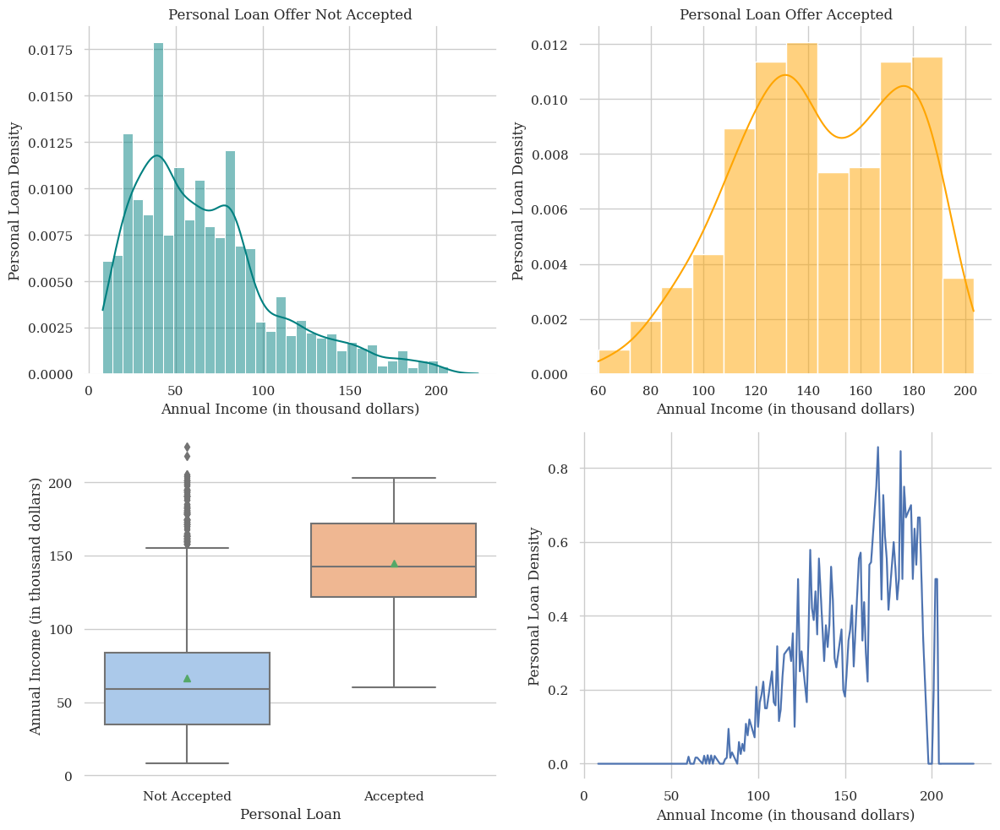

<IPython.core.display.Javascript object>

In [ ]:
investigate_explanatory_response_var(data,'Income','Personal_Loan',explanatory_label='Annual Income (in thousand dollars)')

Observations:
* The Income variable varies between customers who accepted and not accepted the personal loan.
* The mean income for the customers who did not accept the loan is approx USD 65K
* The mean income for the customers who accepted the loan is approx USD 145K
* It represents that the income level of the customer has a high impact on the customer decision to accept a personal loan

### CCAvg Vs Personal_Loan

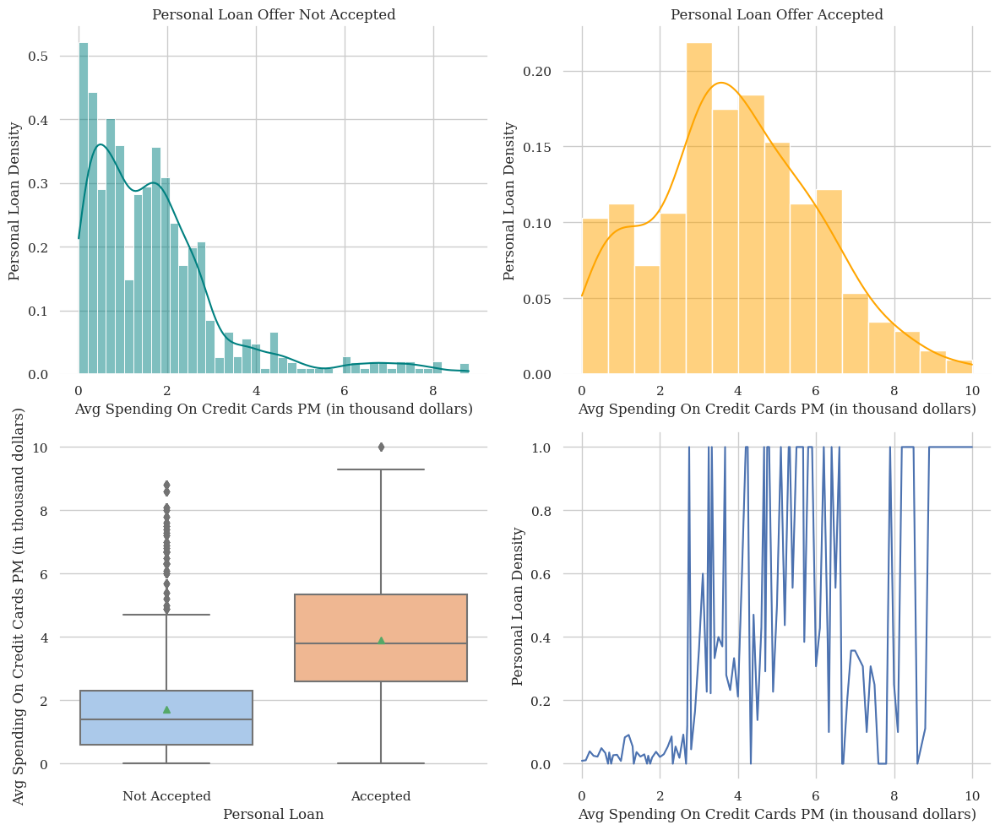

<IPython.core.display.Javascript object>

In [ ]:
investigate_explanatory_response_var(data,'CCAvg','Personal_Loan',explanatory_label='Avg Spending On Credit Cards PM (in thousand dollars)')

Observations:
* It is observed that the customers paying mortage are more likely to accept personal loan
*  The distribution is heavily right skewed

### Mortgage Vs Personal_Loan

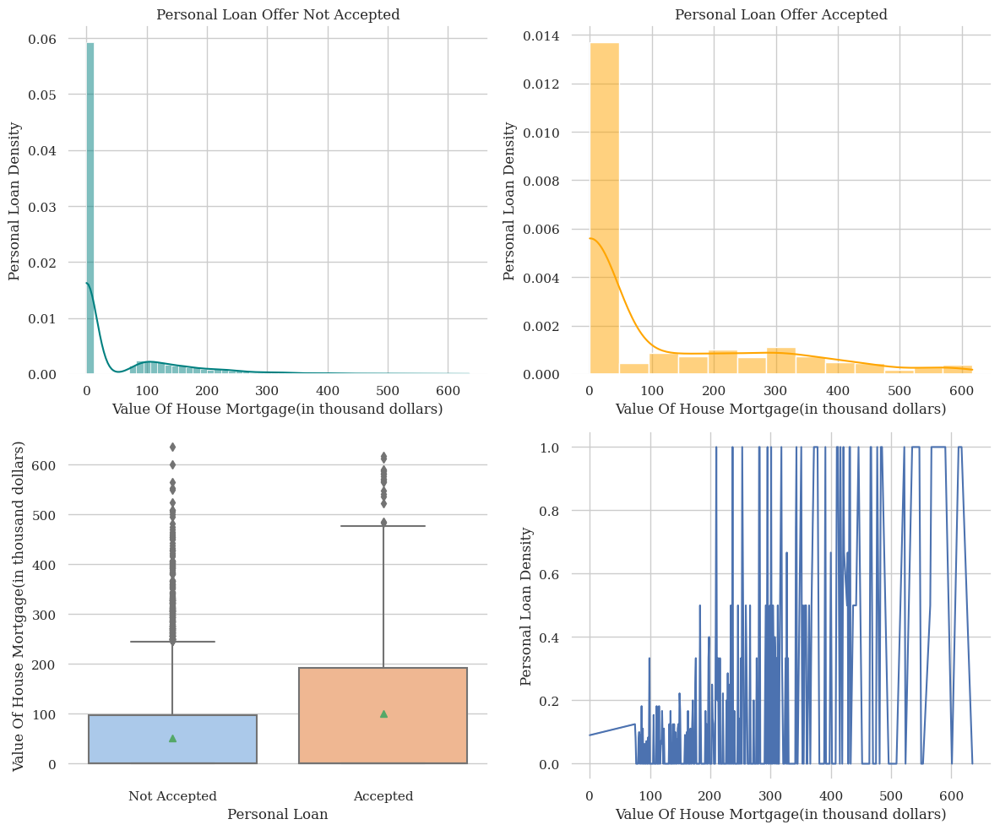

<IPython.core.display.Javascript object>

In [ ]:
investigate_explanatory_response_var(data,'Mortgage','Personal_Loan',explanatory_label='Value Of House Mortgage(in thousand dollars)')

Observations:
* It is observed that the customers paying mortage are accepting the personal loan
* The variable distribution is heavily right skewed due to the high number of customers not paying mortgage

Distribution of the customers paying mortgage only -

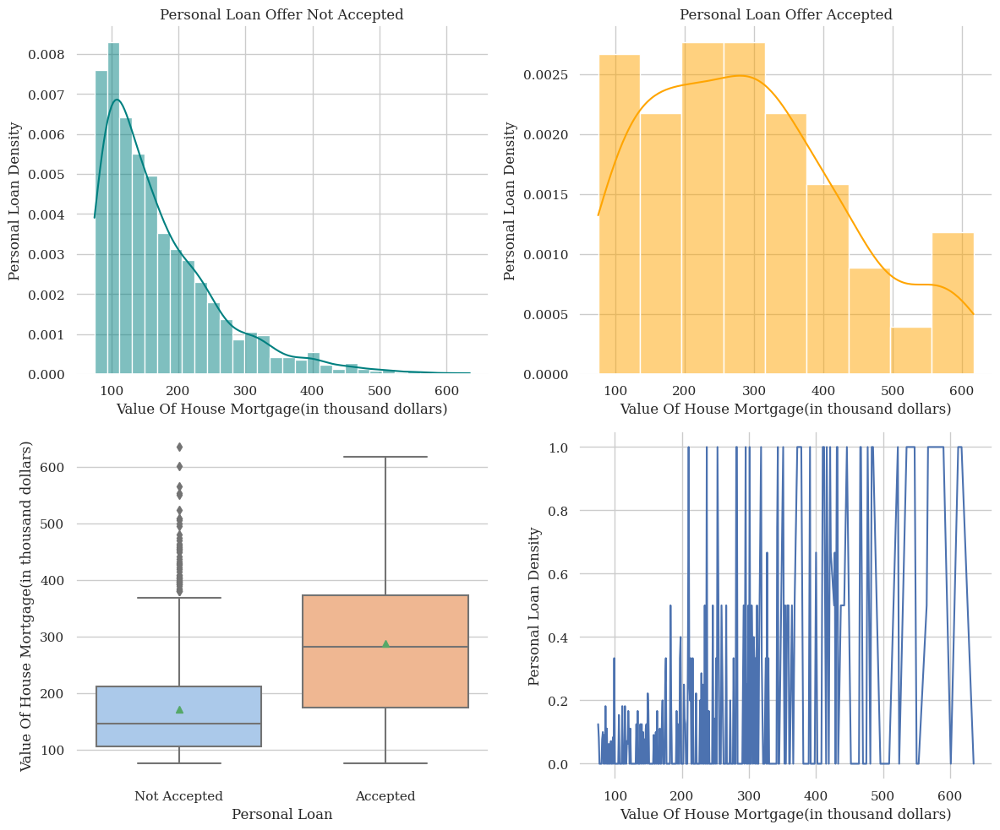

<IPython.core.display.Javascript object>

In [ ]:
investigate_explanatory_response_var(mortgage,'Mortgage','Personal_Loan',explanatory_label='Value Of House Mortgage(in thousand dollars)')

Observations:
*  It is observed that
  * The mean value of mortgage paid by customers but not accepting a personal loan is approx USD 150K USD
  * The mean value of customers accepting personal loan of approx USD 290K
  * As the mortgage value increase, the customer is more likely to accept a personal loan

### B. Plotting Categorical Variables

In [ ]:
data.head()

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,City,State
0,25,1.0,49,4,1.6,1,0,0,1,0,0,0,Pasadena,CA
1,45,19.0,34,3,1.5,1,0,0,1,0,0,0,Los Angeles,CA
2,39,15.0,11,1,1.0,1,0,0,0,0,0,0,Berkeley,CA
3,35,9.0,100,1,2.7,2,0,0,0,0,0,0,San Francisco,CA
4,35,8.0,45,4,1.0,2,0,0,0,0,0,1,Northridge,CA


<IPython.core.display.Javascript object>

In [ ]:
def categorical_graph(data,explanatory,response,explanatory_label=None,perc=True,xticks_labels=None,yaxlabel='Personal Loan Density',legend_title=None,legend_labels=['Not Accepted', 'Accepted'],xtext_rotation=0,graph_kind='bar'):

  count = data[explanatory].nunique()
  sorter = data[response].value_counts().index[-1]

  tab1 = pd.crosstab(data[explanatory], data[response], margins=True,margins_name='Total',rownames=[explanatory],colnames=[response]).sort_values(
        by=sorter, ascending=False
  )


  print("---"*40)
  print(tab1)
  print("---"*40)

  figsize_val = 6
  if graph_kind=='barh':
    figsize_val = 9


  bar_ax = pd.crosstab(data[explanatory], data[response], normalize="index").sort_values(
          by=sorter, ascending=False
      )

  bars = bar_ax.plot(kind=graph_kind, stacked=True,figsize=(count + 5, figsize_val))

  n=None

  total = len(data[response])  # length of the column

  # if n is None:
  #     plt.figure(figsize=(count + 1, 5))
  # else:
  #     plt.figure(figsize=(n + 1, 5))

  for container in bars.containers:

    for p in container.patches:

      if perc == True:
        if graph_kind == 'bar':
          label = "{:.2f}%".format(
            #100 * p.get_height() / total
            100 * p.get_height()
            )  # percentage of each class of the category

        if graph_kind=='barh':
            label = "{:.2f}%".format(
              100 * p.get_width()
            )  # percentage of each class of the category

      else:
          label = p.get_height()  # count of each level of the category

      x = p.get_x() + p.get_width() / 2  # width of the plot
      #y = p.get_height()  # height of the plot
      y=p.get_y()

      bars.annotate(
          label,
          (x, y),
          ha="center",
          va="center",
          size=9,
          color='white',
          xytext=(0,5),
          textcoords="offset points",
      )  # annotate the percentage

  bars.set(xlabel=explanatory_label,ylabel=yaxlabel)

  #xticks_labels=('Undergrad','Graduate','Advanced/Professional')
  if xticks_labels:
    plt.xticks(np.arange(len(xticks_labels)),xticks_labels)

  if graph_kind=='bar':
    plt.legend(loc="upper left",frameon=True,title=legend_title,labels=legend_labels, bbox_to_anchor=(1, 1))

  if graph_kind=='barh':
    plt.legend(loc="lower right",frameon=True,title=legend_title,labels=legend_labels, bbox_to_anchor=(1, 1))

  plt.xticks(rotation=xtext_rotation)

  plt.show()

<IPython.core.display.Javascript object>

### Family Vs Personal_Loan

------------------------------------------------------------------------------------------------------------------------
Personal_Loan     0    1  Total
Family                         
Total          4520  480   5000
4              1088  134   1222
3               877  133   1010
1              1365  107   1472
2              1190  106   1296
------------------------------------------------------------------------------------------------------------------------


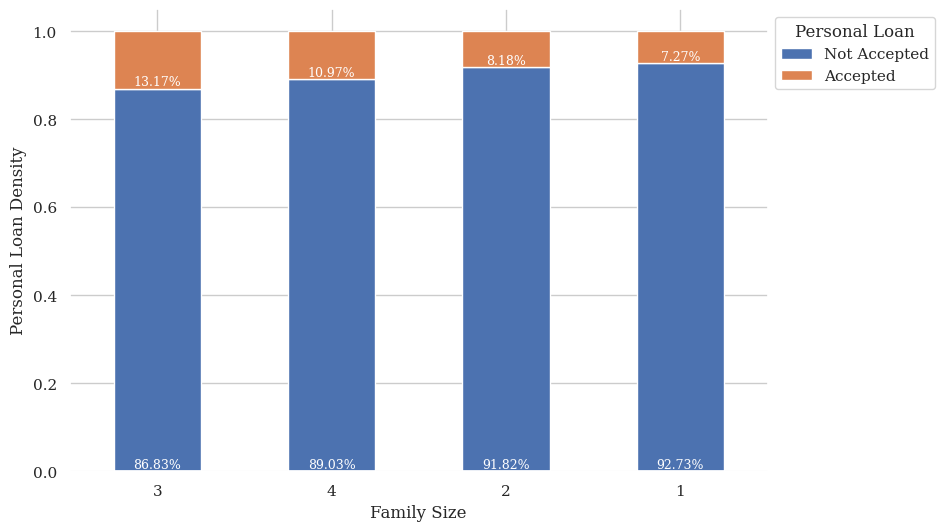

<IPython.core.display.Javascript object>

In [ ]:
categorical_graph(data,'Family','Personal_Loan',explanatory_label='Family Size',legend_title='Personal Loan')

Observations:
* It is observed that famillies of size 3 or 4 have more chances to accept personal loan
* As the familly size grows, customers are more willing to accept personal loans

### Education Vs Personal_Loan

------------------------------------------------------------------------------------------------------------------------
Personal_Loan     0    1  Total
Education                      
Total          4520  480   5000
3              1296  205   1501
2              1221  182   1403
1              2003   93   2096
------------------------------------------------------------------------------------------------------------------------


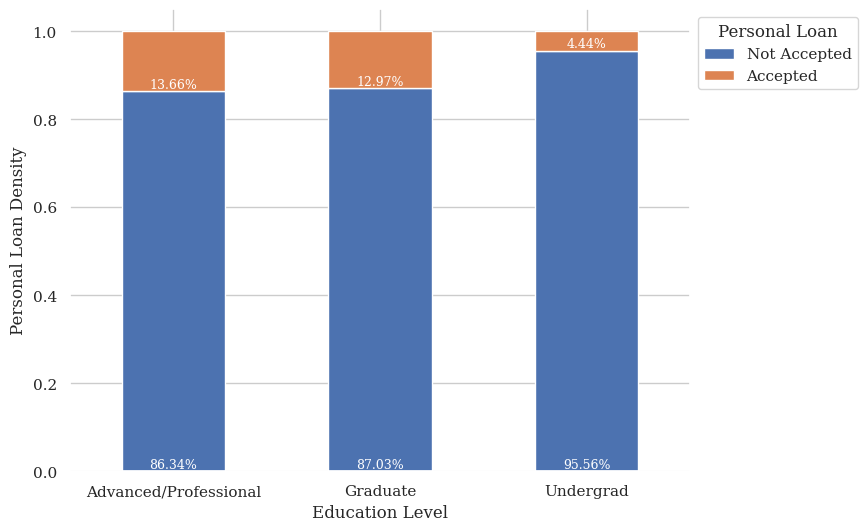

<IPython.core.display.Javascript object>

In [ ]:
categorical_graph(data,'Education','Personal_Loan',explanatory_label='Education Level',legend_title='Personal Loan',xticks_labels=('Advanced/Professional','Graduate','Undergrad'))

Observations:
* It is observed that customers with education level 2 and 3 are more interested to accept a personal loan than education level 1.

### Securities_Account Vs Personal_Loan

------------------------------------------------------------------------------------------------------------------------
Personal_Loan          0    1  Total
Securities_Account                  
Total               4520  480   5000
0                   4058  420   4478
1                    462   60    522
------------------------------------------------------------------------------------------------------------------------


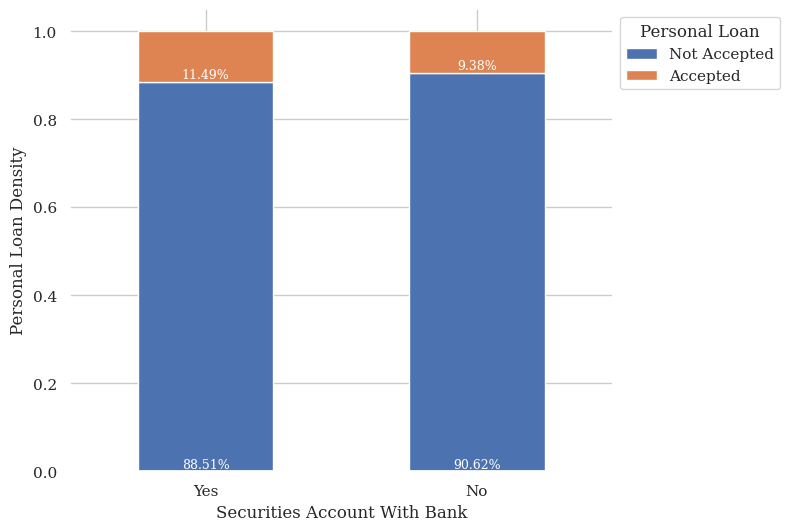

<IPython.core.display.Javascript object>

In [ ]:
categorical_graph(data,'Securities_Account','Personal_Loan',explanatory_label='Securities Account With Bank',legend_title='Personal Loan',xticks_labels=('Yes','No'))

Observations:
* It is observed that customers with Security account are more interested to accept a personal loan

### CD_Account Vs Personal_Loan

------------------------------------------------------------------------------------------------------------------------
Personal_Loan     0    1  Total
CD_Account                     
Total          4520  480   5000
0              4358  340   4698
1               162  140    302
------------------------------------------------------------------------------------------------------------------------


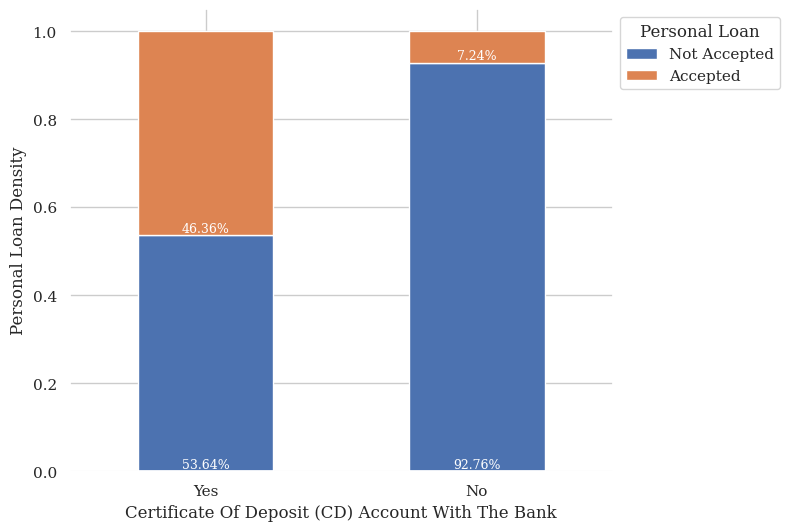

<IPython.core.display.Javascript object>

In [ ]:
categorical_graph(data,'CD_Account','Personal_Loan',explanatory_label='Certificate Of Deposit (CD) Account With The Bank',legend_title='Personal Loan',xticks_labels=('Yes','No'))

Observations:
* It is observed that customers with CD_account are more interested to accept a personal loan

### Online Vs Personal_Loan

------------------------------------------------------------------------------------------------------------------------
Personal_Loan     0    1  Total
Online                         
Total          4520  480   5000
1              2693  291   2984
0              1827  189   2016
------------------------------------------------------------------------------------------------------------------------


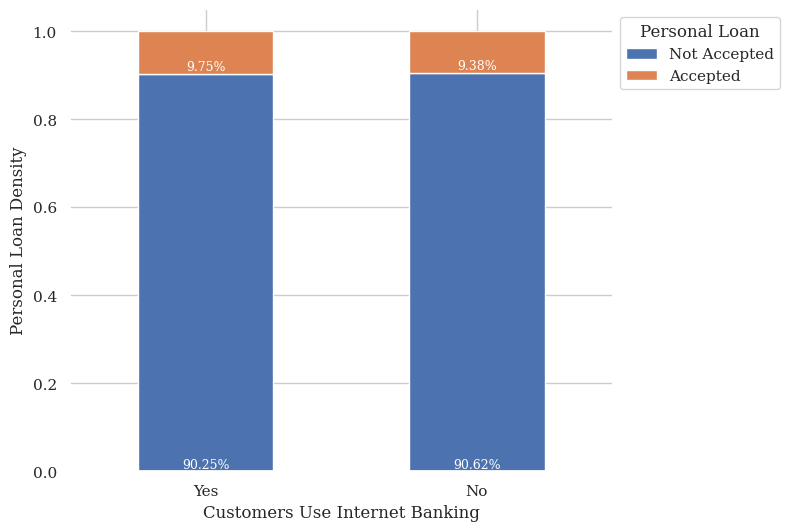

<IPython.core.display.Javascript object>

In [ ]:
categorical_graph(data,'Online','Personal_Loan',explanatory_label='Customers Use Internet Banking',legend_title='Personal Loan',xticks_labels=('Yes','No'))

Observations:
* It is observed that customers use iternet banking services and do not use internet banking services are almost equally interested to accept personal loans

### CreditCard Vs Personal_Loan

------------------------------------------------------------------------------------------------------------------------
Personal_Loan     0    1  Total
CreditCard                     
Total          4520  480   5000
0              3193  337   3530
1              1327  143   1470
------------------------------------------------------------------------------------------------------------------------


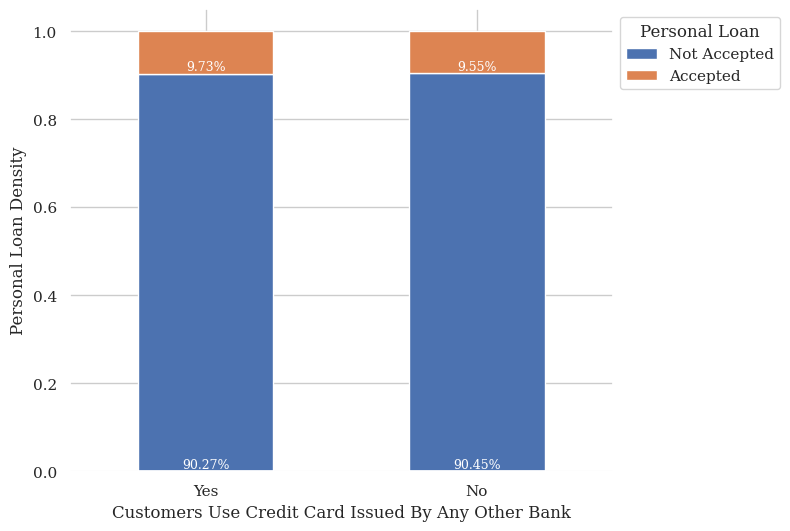

<IPython.core.display.Javascript object>

In [ ]:
categorical_graph(data,'CreditCard','Personal_Loan',explanatory_label='Customers Use Credit Card Issued By Any Other Bank',legend_title='Personal Loan',xticks_labels=('Yes','No'))

Observations:
* It is observed that customers who use credit cards issued by other banks and do not are almost equally interested to accept personal loans

### City Vs Personal_Loan

For a better visualization, used a threshold to pick the most common cities between the customers and assign the remaining to cities as Other City.

------------------------------------------------------------------------------------------------------------------------
Personal_Loan     0    1  Total
City                           
Total          4520  480   5000
Other City     2467  254   2721
Los Angeles     337   38    375
Berkeley        214   27    241
San Diego       248   21    269
San Francisco   238   19    257
Palo Alto       114   16    130
La Jolla         97   15    112
Sacramento      135   13    148
Stanford        114   13    127
Santa Clara      65   12     77
Irvine           69   11     80
San Jose         85   11     96
Pasadena         61   10     71
Santa Barbara    95    8    103
Monterey         66    6     72
Davis           115    6    121
------------------------------------------------------------------------------------------------------------------------


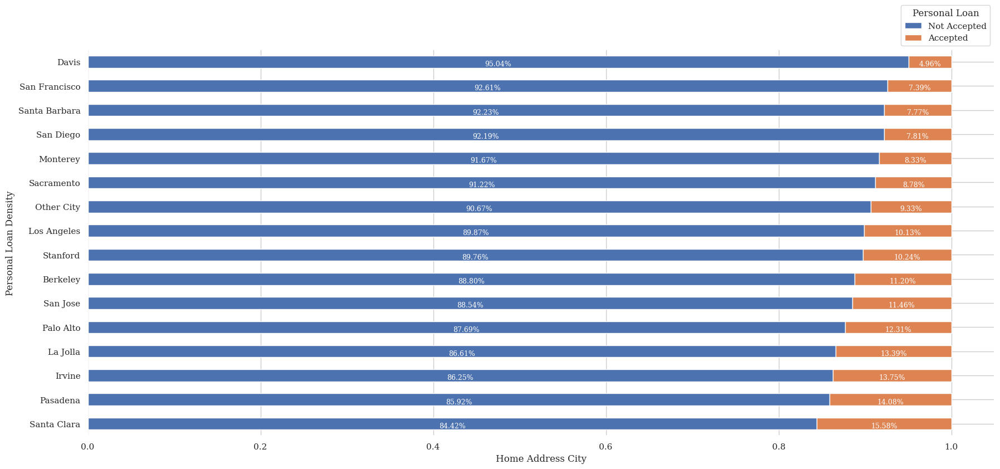

<IPython.core.display.Javascript object>

In [ ]:
cityValues = data['City'].value_counts()
cityList = cityValues[cityValues.values>65].index.to_list()

cityData = data.copy()

cityData['City'] = cityData['City'].apply(lambda x:x if x in cityList else 'Other City')
#cityData['City'].value_counts()
categorical_graph(cityData,'City','Personal_Loan',explanatory_label='Home Address City',legend_title='Personal Loan',graph_kind='barh',perc=True)

Observations:
* It is observed that Santa Clara shows the greatest ratio of customers interested to accept personal loans followed by Pasadena and Irvine

### State Vs Personal_Loan

------------------------------------------------------------------------------------------------------------------------
Personal_Loan     0    1  Total
State                          
CA             4514  480   4994
Total          4520  480   5000
BC                6    0      6
------------------------------------------------------------------------------------------------------------------------


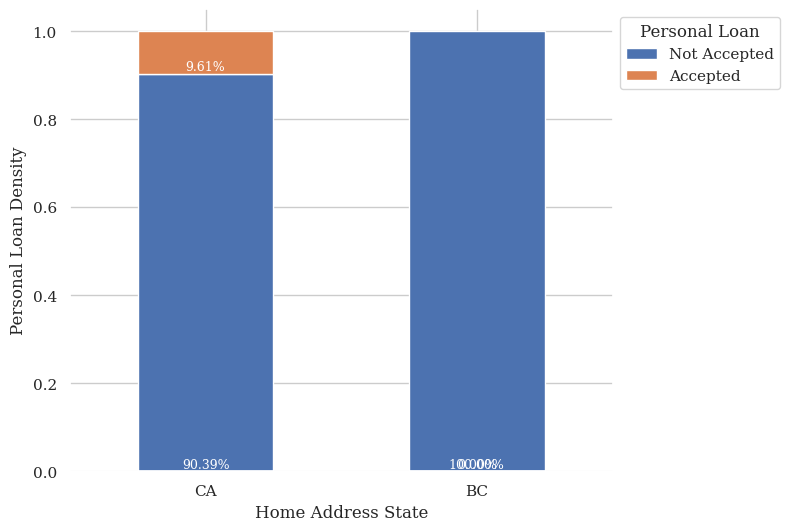

<IPython.core.display.Javascript object>

In [ ]:
categorical_graph(data,'State','Personal_Loan',explanatory_label='Home Address State',legend_title='Personal Loan')

Observations:
* The customers residing in CA are more interested to accept personal loans than the customers in BC

## 3. Multivariate Analysis

### Correlation

In [ ]:
data.corr(numeric_only=True)

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
Age,1.000000,0.977182,-0.055269,-0.046418,-0.052012,0.041334,-0.012539,-0.007726,-0.000436,0.008043,0.013702,0.007681
Experience,0.977182,1.000000,-0.049046,-0.045528,-0.048718,0.018074,-0.013365,-0.014013,-0.000465,0.005526,0.013459,0.008834
Income,-0.055269,-0.049046,1.000000,-0.157501,0.645984,-0.187524,0.206806,0.502462,-0.002616,0.169738,0.014206,-0.002385
Family,-0.046418,-0.045528,-0.157501,1.000000,-0.109275,0.064929,-0.020445,0.061367,0.019994,0.014110,0.010354,0.011588
CCAvg,-0.052012,-0.048718,0.645984,-0.109275,1.000000,-0.136124,0.109905,0.366889,0.015086,0.136534,-0.003611,-0.006689
Education,0.041334,0.018074,-0.187524,0.064929,-0.136124,1.000000,-0.033327,0.136722,-0.010812,0.013934,-0.015004,-0.011014
Mortgage,-0.012539,-0.013365,0.206806,-0.020445,0.109905,-0.033327,1.000000,0.142095,-0.005411,0.089311,-0.005995,-0.007231
Personal_Loan,-0.007726,-0.014013,0.502462,0.061367,0.366889,0.136722,0.142095,1.000000,0.021954,0.316355,0.006278,0.002802
Securities_Account,-0.000436,-0.000465,-0.002616,0.019994,0.015086,-0.010812,-0.005411,0.021954,1.000000,0.317034,0.012627,-0.015028
CD_Account,0.008043,0.005526,0.169738,0.014110,0.136534,0.013934,0.089311,0.316355,0.317034,1.000000,0.175880,0.278644


<IPython.core.display.Javascript object>

* 1 indicates a strong positive relationship.
* -1 indicates a strong negative relationship.
* A result of zero indicates no relationship at all.

### Covariance

In [ ]:
data.cov(numeric_only=True)

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
Age,131.404166,126.051951,-29.164822,-0.610664,-1.041997,0.397949,-14.619518,-0.026092,-0.001529,0.021965,0.077058,0.040118
Experience,126.051951,126.630804,-25.406909,-0.587978,-0.958112,0.170819,-15.297866,-0.046459,-0.001602,0.014816,0.074303,0.045295
Income,-29.164822,-25.406909,2119.104235,-8.320957,51.970200,-7.250120,968.321693,6.814640,-0.036834,1.861611,0.320822,-0.050025
Family,-0.610664,-0.587978,-8.320957,1.317130,-0.219174,0.062584,-2.386602,0.020750,0.007017,0.003858,0.005830,0.006060
CCAvg,-1.041997,-0.958112,51.970200,-0.219174,3.054312,-0.199803,19.536778,0.188910,0.008063,0.056850,-0.003096,-0.005327
Education,0.397949,0.170819,-7.250120,0.062584,-0.199803,0.705380,-2.847012,0.033831,-0.002777,0.002788,-0.006182,-0.004215
Mortgage,-14.619518,-15.297866,968.321693,-2.386602,19.536778,-2.847012,10345.697538,4.258167,-0.168308,2.164305,-0.299144,-0.335114
Personal_Loan,-0.026092,-0.046459,6.814640,0.020750,0.188910,0.033831,4.258167,0.086801,0.001978,0.022206,0.000907,0.000376
Securities_Account,-0.001529,-0.001602,-0.036834,0.007017,0.008063,-0.002777,-0.168308,0.001978,0.093519,0.023099,0.001894,-0.002094
CD_Account,0.021965,0.014816,1.861611,0.003858,0.056850,0.002788,2.164305,0.022206,0.023099,0.056763,0.020557,0.030248


<IPython.core.display.Javascript object>

Covariance is a measure of the directional relationship between two random variables

1. Positive: A positive covariance value suggests that both random variables move in the same direction.

2. Negative: A negative covariance value suggests that both random variables move in the opposite direction.

3. Zero: When the two random variables are independent of each other, the covariance between them is zero.

### Strong Correlation

In [ ]:
# Calculate correlation matrix
correlation_matrix = data.corr()

colNames = correlation_matrix.columns

for variable_name in colNames:

  # Get correlations of each feature with the target attribute
  correlations = abs(correlation_matrix[variable_name])

  # Select features with strong correlation (e.g., above 0.5)
  strong_correlations = correlations[(correlations > 0.5) & (correlations != correlations[variable_name])]

  # Print the strongly correlated attributes
  if len(strong_correlations) > 0:
    print([variable_name],": attribute strong correlation (>0.5) with",strong_correlations.index.values,":",strong_correlations.values)




['Age'] : attribute strong correlation (>0.5) with ['Experience'] : [0.97718169]
['Experience'] : attribute strong correlation (>0.5) with ['Age'] : [0.97718169]
['Income'] : attribute strong correlation (>0.5) with ['CCAvg' 'Personal_Loan'] : [0.64598367 0.50246229]
['CCAvg'] : attribute strong correlation (>0.5) with ['Income'] : [0.64598367]
['Personal_Loan'] : attribute strong correlation (>0.5) with ['Income'] : [0.50246229]


<IPython.core.display.Javascript object>

### Pairplot

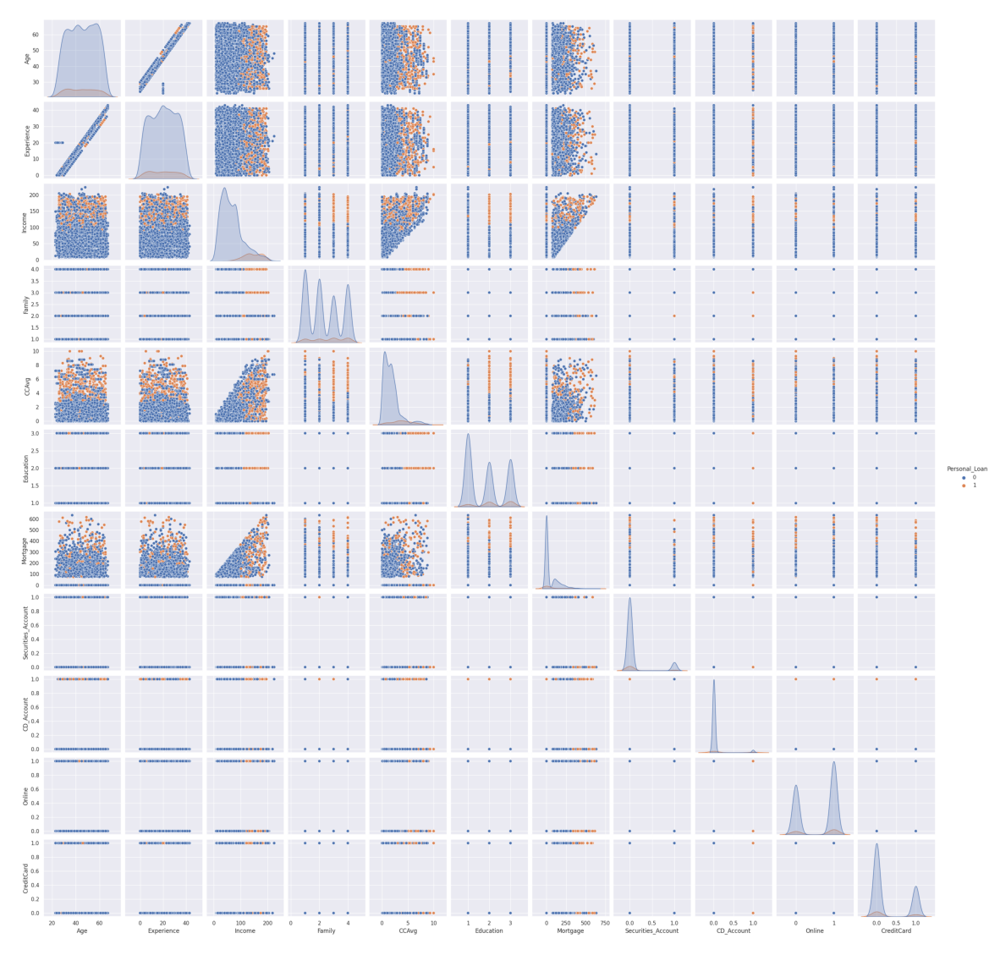

<IPython.core.display.Javascript object>

In [178]:
from PIL import Image
# plt.figure(figsize=(31,41))
# sns.pairplot(data, hue="Personal_Loan")
# plt.savefig('/content/drive/MyDrive/Colab_Notebooks/Machine_Learning/project/plt_personal_loan_pairplot.png')
#plt.show();

plt.figure(figsize=(15,41))
image_path = '/content/drive/MyDrive/Colab_Notebooks/Machine_Learning/project/plt_personal_loan_pairplot.png'
image = Image.open(image_path)
plt.imshow(image)
plt.axis('off')
plt.show();


#### Observations:

### Heatmap

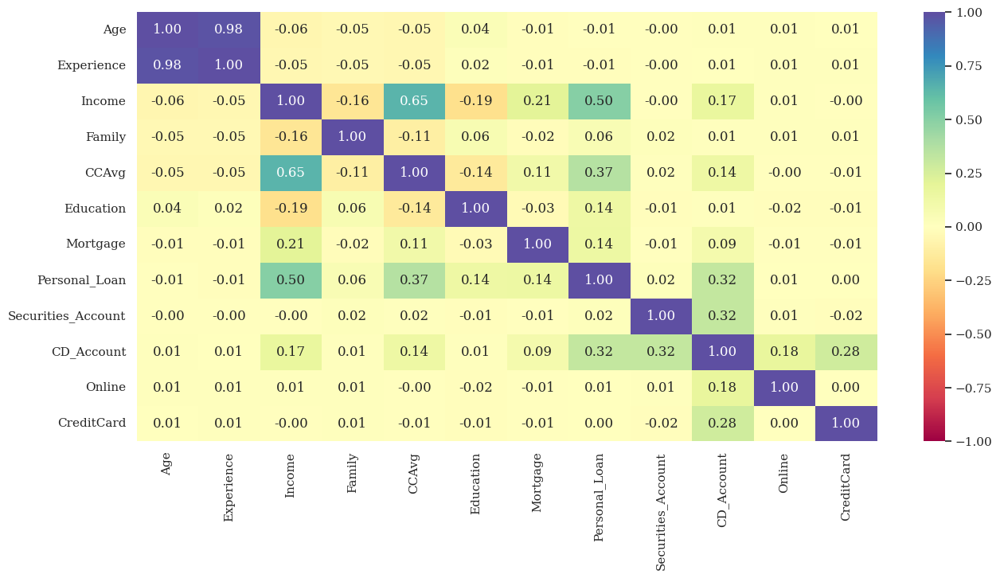

<IPython.core.display.Javascript object>

In [ ]:
plt.figure(figsize=(15, 7))
sns.heatmap(
    data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)
plt.show()

Observations:
* Correlation
  * The correlation between Age and Experience is very high (value = 0.98)
  * The correlation between Income and CCAvg is low (value = 0.65)
  * All other correlation values are quiet small for consideration
* Low importance is expected for the variables: **Age, Experience, Credit card and Online**
* High to mediam importance is expected for the variables: **Income, Familly, CCAvg, Education, Mortgage, Security Account and CD_Account**

## Data Preprocessing

* Missing value treatment
* Feature engineering (if needed)
* Outlier detection and treatment (if needed)
* Preparing data for modeling
* Any other preprocessing steps (if needed)

In [ ]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Age,5000.0,NaN,NaN,NaN,45.3384,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,NaN,NaN,NaN,20.3276,11.253035,0.0,11.0,20.0,30.0,43.0
Income,5000.0,NaN,NaN,NaN,73.7742,46.033729,8.0,39.0,64.0,98.0,224.0
Family,5000.0,NaN,NaN,NaN,2.3964,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,NaN,NaN,NaN,1.937938,1.747659,0.0,0.7,1.5,2.5,10.0
Education,5000.0,NaN,NaN,NaN,1.881,0.839869,1.0,1.0,2.0,3.0,3.0
Mortgage,5000.0,NaN,NaN,NaN,56.4988,101.713802,0.0,0.0,0.0,101.0,635.0
Personal_Loan,5000.0,NaN,NaN,NaN,0.096,0.294621,0.0,0.0,0.0,0.0,1.0
Securities_Account,5000.0,NaN,NaN,NaN,0.1044,0.305809,0.0,0.0,0.0,0.0,1.0
CD_Account,5000.0,NaN,NaN,NaN,0.0604,0.23825,0.0,0.0,0.0,0.0,1.0


<IPython.core.display.Javascript object>

### 1. Missing Values

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Experience          5000 non-null   float64
 2   Income              5000 non-null   int64  
 3   Family              5000 non-null   int64  
 4   CCAvg               5000 non-null   float64
 5   Education           5000 non-null   int64  
 6   Mortgage            5000 non-null   int64  
 7   Personal_Loan       5000 non-null   int64  
 8   Securities_Account  5000 non-null   int64  
 9   CD_Account          5000 non-null   int64  
 10  Online              5000 non-null   int64  
 11  CreditCard          5000 non-null   int64  
 12  City                5000 non-null   object 
 13  State               5000 non-null   object 
dtypes: float64(2), int64(10), object(2)
memory usage: 547.0+ KB


<IPython.core.display.Javascript object>

In [ ]:
#checking missing values count
print("Missing values count:")
print(data.isnull().sum())
print("-"*50)



Missing values count:
Age                   0
Experience            0
Income                0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal_Loan         0
Securities_Account    0
CD_Account            0
Online                0
CreditCard            0
City                  0
State                 0
dtype: int64
--------------------------------------------------


<IPython.core.display.Javascript object>

### 2. Outlier Detection and Treatment

In [ ]:
#outlier_data = data.copy()

def treating_outliers(outlier_df,feature_name,new_feature_name):
  for i in outlier_df[feature_name]:
    q1 = outlier_df[feature_name].quantile(0.25)
    q3 = outlier_df[feature_name].quantile(0.75)
    iqr = q3-q1
    Lower_tail = q1 - 1.5 * i
    Upper_tail = q3 + 1.5 * iqr

    if i > Upper_tail or i < Lower_tail:
      outlier_df[new_feature_name] = outlier_df[feature_name].replace(i,np.mean(outlier_df[feature_name]))
  return outlier_df


<IPython.core.display.Javascript object>

* As observed in EDA, Outliers are consistent with the data hence no action is required for outlier treatment

### 3. Normalizing Mortgage Data

In [ ]:
data_model = data.copy()

def normalize_data(dataset, feature_name,new_feature_category_name):
  dataset[new_feature_category_name] = dataset[feature_name].apply(lambda x:1 if x>=1 else 0)
  dataset[new_feature_category_name] = dataset[new_feature_category_name].astype('category')
  return dataset


<IPython.core.display.Javascript object>

In [ ]:
data_model = normalize_data(data_model,'Mortgage','Mortgage_category')
data_model.drop('Mortgage', axis =1, inplace=True)
data_model

,Age,Experience,Income,Family,CCAvg,Education,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,City,State,Mortgage_category
0,25,1.0,49,4,1.6,1,0,1,0,0,0,Pasadena,CA,0
1,45,19.0,34,3,1.5,1,0,1,0,0,0,Los Angeles,CA,0
2,39,15.0,11,1,1.0,1,0,0,0,0,0,Berkeley,CA,0
3,35,9.0,100,1,2.7,2,0,0,0,0,0,San Francisco,CA,0
4,35,8.0,45,4,1.0,2,0,0,0,0,1,Northridge,CA,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3.0,40,1,1.9,3,0,0,0,1,0,Irvine,CA,0
4996,30,4.0,15,4,0.4,1,0,0,0,1,0,La Jolla,CA,1
4997,63,39.0,24,2,0.3,3,0,0,0,0,0,Ojai,CA,0
4998,65,40.0,49,3,0.5,2,0,0,0,1,0,Los Angeles,CA,0


<IPython.core.display.Javascript object>

------------------------------------------------------------------------------------------------------------------------
Personal_Loan         0    1  Total
Mortgage_category                  
Total              4520  480   5000
0                  3150  312   3462
1                  1370  168   1538
------------------------------------------------------------------------------------------------------------------------


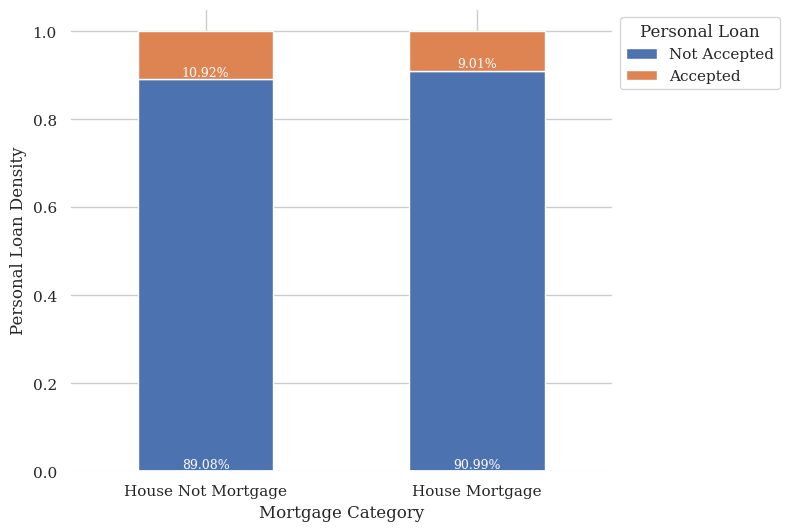

<IPython.core.display.Javascript object>

In [ ]:
categorical_graph(data_model,'Mortgage_category','Personal_Loan',explanatory_label='Mortgage Category',legend_title='Personal Loan',xticks_labels=('House Not Mortgage','House Mortgage'))

### 4. Creating The Dummy Variables

In [ ]:
data_model = pd.get_dummies(
    data_model,
    columns=[
        "Education",
        "City",
        "State",
    ],
    drop_first=True,
)

<IPython.core.display.Javascript object>

In [ ]:
data_model.head(15)

,Age,Experience,Income,Family,CCAvg,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Mortgage_category,Education_2,Education_3,City_Alameda,City_Alamo,City_Albany,City_Alhambra,City_Anaheim,City_Antioch,City_Aptos,City_Arcadia,City_Arcata,City_Bakersfield,City_Baldwin Park,City_Banning,City_Bella Vista,City_Belmont,City_Belvedere Tiburon,City_Ben Lomond,City_Berkeley,City_Beverly Hills,City_Bodega Bay,City_Bonita,City_Boulder Creek,City_Brea,City_Brisbane,City_Burlingame,City_Calabasas,City_Camarillo,City_Campbell,City_Canoga Park,City_Capistrano Beach,City_Capitola,City_Cardiff By The Sea,City_Carlsbad,City_Carpinteria,City_Carson,City_Castro Valley,City_Ceres,City_Chatsworth,City_Chico,City_Chino,City_Chino Hills,City_Chula Vista,City_Citrus Heights,City_Claremont,City_Clearlake,City_Clovis,City_Concord,City_Costa Mesa,City_Crestline,City_Culver City,City_Cupertino,City_Cypress,City_Daly City,City_Danville,City_Davis,City_Diamond Bar,City_Edwards,City_El Dorado Hills,City_El Segundo,City_El Sobrante,City_Elk Grove,City_Emeryville,City_Encinitas,City_Escondido,City_Eureka,City_Fairfield,City_Fallbrook,City_Fawnskin,City_Folsom,City_Fremont,City_Fresno,City_Fullerton,City_Garden Grove,City_Gilroy,City_Glendale,City_Glendora,City_Goleta,City_Greenbrae,City_Hacienda Heights,City_Half Moon Bay,City_Hawthorne,City_Hayward,City_Hermosa Beach,City_Highland,City_Hollister,City_Hopland,City_Huntington Beach,City_Imperial,City_Inglewood,City_Irvine,City_La Jolla,City_La Mesa,City_La Mirada,City_La Palma,City_Ladera Ranch,City_Laguna Hills,City_Laguna Niguel,City_Lake Forest,City_Larkspur,City_Livermore,City_Loma Linda,City_Lomita,City_Lompoc,City_Long Beach,City_Los Alamitos,City_Los Altos,City_Los Angeles,City_Los Gatos,City_Manhattan Beach,City_March Air Reserve Base,City_Marina,City_Martinez,City_Menlo Park,City_Merced,City_Milpitas,City_Mission Hills,City_Mission Viejo,City_Modesto,City_Monrovia,City_Montague,City_Montclair,City_Montebello,City_Monterey,City_Monterey Park,City_Moraga,City_Morgan Hill,City_Moss Landing,City_Mountain View,City_Napa,City_National City,City_Newbury Park,City_Newport Beach,City_North Hills,City_North Hollywood,City_Northridge,City_Norwalk,City_Novato,City_Oak View,City_Oakland,City_Oceanside,City_Ojai,City_Orange,City_Oxnard,City_Pacific Grove,City_Pacific Palisades,City_Palo Alto,City_Palos Verdes Peninsula,City_Pasadena,City_Placentia,City_Pleasant Hill,City_Pleasanton,City_Pomona,City_Porter Ranch,City_Portola Valley,City_Poway,City_Rancho Cordova,City_Rancho Cucamonga,City_Rancho Palos Verdes,City_Redding,City_Redlands,City_Redondo Beach,City_Redwood City,City_Reseda,City_Richmond,City_Ridgecrest,City_Rio Vista,City_Riverside,City_Rohnert Park,City_Rosemead,City_Roseville,City_Rudno nad Hronom,City_Sacramento,City_Salinas,City_San Anselmo,City_San Bernardino,City_San Bruno,City_San Clemente,City_San Diego,City_San Dimas,City_San Francisco,City_San Gabriel,City_San Jose,City_San Juan Bautista,City_San Juan Capistrano,City_San Leandro,City_San Luis Obispo,City_San Luis Rey,City_San Marcos,City_San Mateo,City_San Pablo,City_San Rafael,City_San Ramon,City_San Ysidro,City_Sanger,City_Santa Ana,City_Santa Barbara,City_Santa Clara,City_Santa Clarita,City_Santa Cruz,City_Santa Monica,City_Santa Rosa,City_Santa Ynez,City_Saratoga,City_Sausalito,City_Seal Beach,City_Seaside,City_Sherman Oaks,City_Sierra Madre,City_Signal Hill,City_Simi Valley,City_Sonora,City_South Gate,City_South Lake Tahoe,City_South Pasadena,City_South San Francisco,City_Stanford,City_Stinson Beach,City_Stockton,City_Studio City,City_Sunland,City_Sunnyvale,City_Sylmar,City_Tahoe City,City_Tehachapi,City_Thousand Oaks,City_Torrance,City_Trinity Center,City_Tustin,City_Ukiah,City_Upland,City_Valencia,City_Vallejo,City_Van Nuys,City_Venice,City_Ventura,City_Vista,City_Walnut Creek,City_Weed,City_West Covina,City_West Sacramento,City_Westlake Village,City_Whittier,City_Woodland Hills,City_Yorba Linda,City_Yucaipa,State_CA
0,25,1.0

<IPython.core.display.Javascript object>

In [ ]:
data_model.shape

(5000, 258)

<IPython.core.display.Javascript object>

### 5. Splitting The Data

In [ ]:
X = data_model.drop('Personal_Loan',axis=1)
y = data_model['Personal_Loan']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

<IPython.core.display.Javascript object>

In [ ]:
#Checking the train and test dataset sizes
print(f'X_train shape:{X_train.shape}')
print(f'X_test shape:{X_test.shape}')

X_train shape:(3500, 257)
X_test shape:(1500, 257)


<IPython.core.display.Javascript object>

In [ ]:
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Percentage of classes in training set:
0    0.905429
1    0.094571
Name: Personal_Loan, dtype: float64
Percentage of classes in test set:
0    0.900667
1    0.099333
Name: Personal_Loan, dtype: float64


<IPython.core.display.Javascript object>

#### Creating functions to calculate Recall and Confusion Matrix

In [ ]:
def model_performance_classification_sklearn_with_threshold(model, predictors, target, threshold=0.5):
    """
    Function to compute different metrics, based on the threshold specified, to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # predicting using the independent variables
    pred_prob = model.predict_proba(predictors)[:, 1]
    pred_thres = pred_prob > threshold
    pred = np.round(pred_thres)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

In [ ]:
## Function to create confusion matrix
def make_confusion_matrix(model,predictors,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth

    '''
    y_predict = model.predict(predictors)
    cm=confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

<IPython.core.display.Javascript object>

In [ ]:
def get_recall_score(model, predictors, target):
    """
    model: classifier
    predictors: independent variables
    target: dependent variable

    """
    prediction = model.predict(predictors)
    return recall_score(target, prediction)

<IPython.core.display.Javascript object>

## Model Building

## 1. Decision Tree

In [ ]:
#function to plot a decision tree
def plot_tree(model, Predictor):
    feature_names = Predictor.columns.to_list()
    plt.figure(figsize=(20, 30))
    out = tree.plot_tree(
        model,
        feature_names=feature_names,
        filled=True,
        fontsize=9,
        node_ids=False,
        class_names=None,
    )
    # below code will add arrows to the decision tree split if they are missing
    for o in out:
        arrow = o.arrow_patch
        if arrow is not None:
            arrow.set_edgecolor("black")
            arrow.set_linewidth(1)
    plt.show()

<IPython.core.display.Javascript object>

#### To avoid ending a bias model, we should balance the class weights

In [ ]:
#creating the decission tree model
tree_0 = DecisionTreeClassifier(criterion="gini", class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

<IPython.core.display.Javascript object>

In [ ]:
#fitting the training data
tree_0.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

<IPython.core.display.Javascript object>

### Model Evaluation Criterion

#### Model performance Evaluation of Tree_0

In [ ]:
#Calculating the Recall for train and test data
Recall_Train_TR_0 = get_recall_score(tree_0, X_train, y_train)
print(f'Recall for Tree_0 on Train Data = {Recall_Train_TR_0}')
Recall_Test_TR_0 = get_recall_score(tree_0, X_test, y_test)
print(f'Recall for Tree_0 on Test Data = {Recall_Test_TR_0}')

Recall for Tree_0 on Train Data = 1.0
Recall for Tree_0 on Test Data = 0.87248322147651


<IPython.core.display.Javascript object>

In [ ]:
tree_0_model_train_performance = model_performance_classification_sklearn_with_threshold(tree_0,X_train,y_train)
tree_0_model_train_performance

,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


<IPython.core.display.Javascript object>

In [ ]:
tree_0_model_test_performance = model_performance_classification_sklearn_with_threshold(tree_0,X_test,y_test)
tree_0_model_test_performance

,Accuracy,Recall,Precision,F1
0,0.98,0.872483,0.921986,0.896552


<IPython.core.display.Javascript object>

Mismatch is observed between train and test sets performance, hence its assumed that the Tree_0 model is overfitting the data. \
Next, observe the confusion matrix and the tree structure.

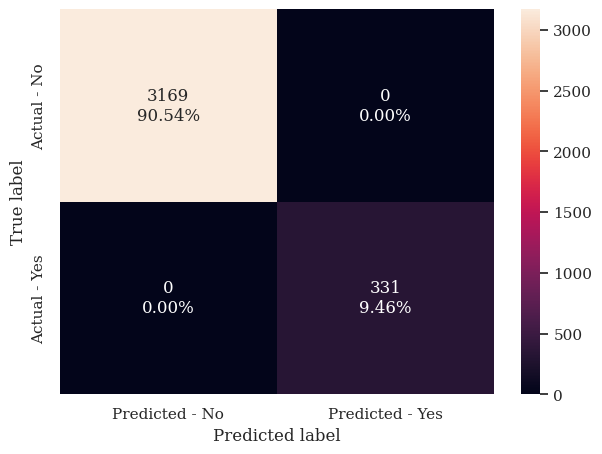

<IPython.core.display.Javascript object>

In [ ]:
make_confusion_matrix(tree_0, X_train, y_train)

##### The model is perfectly overfitting the data as per the observations from the confusion matric, the FN & FP are 0%

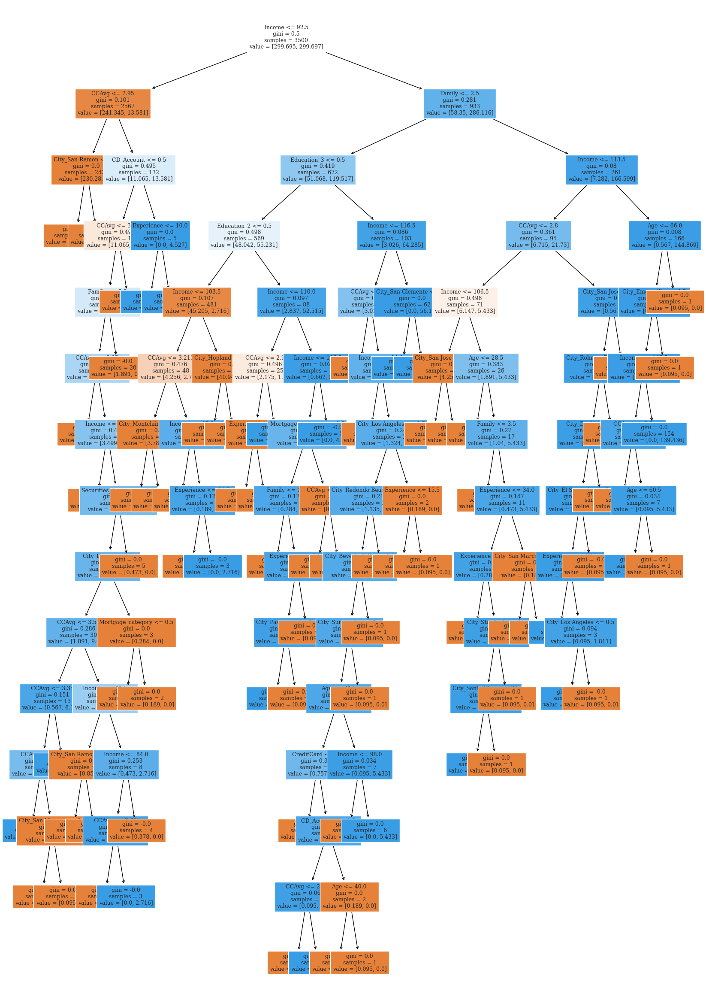

<IPython.core.display.Javascript object>

In [ ]:
#plotting the tree
plot_tree(tree_0,X_train)

*   The original tree Tree_0 is complicated and overfitting the training data set. So pre-prunning and post proning are required to improve the model performance.
*   One observation on Tree_0 -  the first split was on the "Income" variable, so let's observe the variable importances



In [ ]:
def view_feature_importance(model, predictors):
    print("The features importances:")

    importances_df = pd.DataFrame(
        model.feature_importances_, columns=["Imp"], index=predictors.columns
    ).sort_values(by="Imp", ascending=False)

    print(importances_df.head(10))


    importances = model.feature_importances_
    indices = np.argsort(importances)

    plt.figure(figsize=(12, 65))
    plt.title("Feature Importances")
    plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
    plt.yticks(range(len(indices)), [predictors.columns[i] for i in indices])
    plt.xlabel("Relative Importance")
    plt.show()

<IPython.core.display.Javascript object>

The features importances:
                         Imp
Income              0.640193
Education_2         0.136399
CCAvg               0.096097
Education_3         0.048025
Family              0.046053
CD_Account          0.008564
Age                 0.005357
Experience          0.003461
CreditCard          0.002235
Securities_Account  0.001969


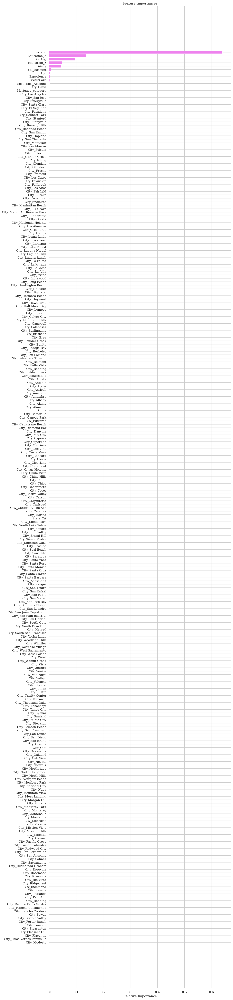

<IPython.core.display.Javascript object>

In [ ]:
view_feature_importance(tree_0,X_train)



* Its observed that the top importance variable is Income and least importance are the cities
* The top 5 variables are :
  * Income
  * Education_2
  * CCAvg
  * Education_3
  * Family



## Model Performance Improvement

### 1. Pre-prunning (Hyperparameter Tuning)

#### **GridSearch**

GridSearch to compute the optimum hyperparameter values

In [ ]:
print(f'''The max depth of the tree_0 =  {tree_0.tree_.max_depth}
The node_count = {tree_0.tree_.node_count}
The number of leaves = {tree_0.tree_.n_leaves}''')

The max depth of the tree_0 =  14
The node_count = 151
The number of leaves = 76


<IPython.core.display.Javascript object>

In [ ]:
t_grid = DecisionTreeClassifier(random_state=1, class_weight={0: 0.094571, 1: 0.905429})

# Grid of parameters
parameters = {
    "max_depth": [5, 10, 15, 20, None],
    "criterion": ["entropy", "gini"],
    "splitter": ["best", "random"],
    'min_samples_leaf': [1, 2, 5, 7, 10,15,20],
    'max_leaf_nodes' : [2, 3, 5, 10],
    "min_impurity_decrease": [0.00001, 0.0001, 0.01],
}

scorer = make_scorer(recall_score)

# Run the grid search
grid_obj = GridSearchCV(t_grid, parameters, scoring=scorer, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
t_grid = grid_obj.best_estimator_

# Fit the best algorithm to the data.
t_grid.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.094571, 1: 0.905429},
                       criterion='entropy', max_depth=5, max_leaf_nodes=3,
                       min_impurity_decrease=1e-05, random_state=1)

<IPython.core.display.Javascript object>

In [ ]:
Recall_Train_TR_Grid = get_recall_score(t_grid, X_train, y_train)
print(f'Recall for t_grid on Train Data = {Recall_Train_TR_Grid}')
Recall_Test_TR_Grid = get_recall_score(t_grid, X_test, y_test)
print(f'Recall for t_grid on Test Data = {Recall_Test_TR_Grid}')

Recall for t_grid on Train Data = 1.0
Recall for t_grid on Test Data = 1.0


<IPython.core.display.Javascript object>

In [ ]:
t_grid_model_train_performance = model_performance_classification_sklearn_with_threshold(t_grid,X_train,y_train)
t_grid_model_train_performance

,Accuracy,Recall,Precision,F1
0,0.790286,1.0,0.310798,0.474212


<IPython.core.display.Javascript object>

In [ ]:
t_grid_model_test_performance = model_performance_classification_sklearn_with_threshold(t_grid,X_test,y_test)
t_grid_model_test_performance

,Accuracy,Recall,Precision,F1
0,0.779333,1.0,0.310417,0.473768


<IPython.core.display.Javascript object>

The grid model seems to overfit the test data

The features importances:
                               Imp
Income                    0.850779
CCAvg                     0.149221
Age                       0.000000
City_Redlands             0.000000
City_Ridgecrest           0.000000
City_Richmond             0.000000
City_Reseda               0.000000
City_Redwood City         0.000000
City_Redondo Beach        0.000000
City_Rancho Palos Verdes  0.000000


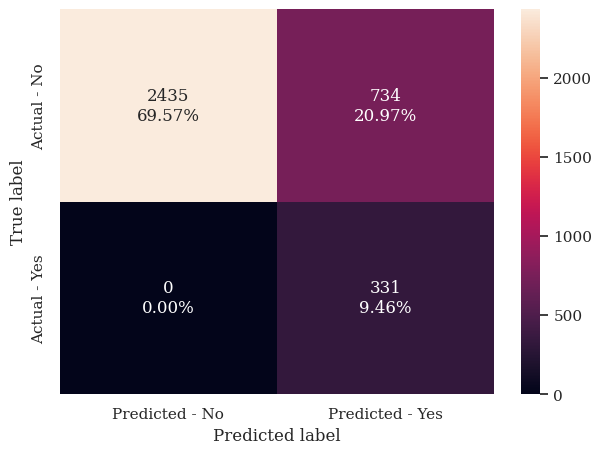

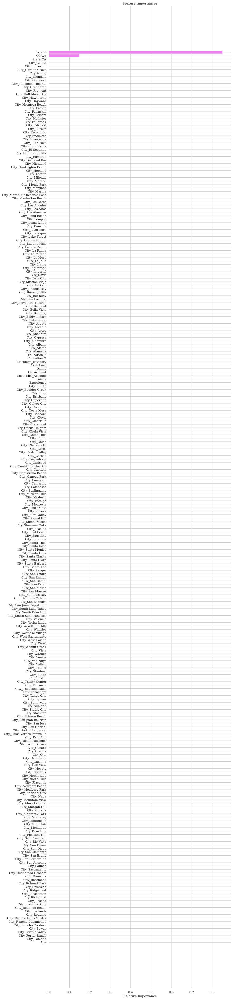

<IPython.core.display.Javascript object>

In [ ]:
make_confusion_matrix(t_grid, X_train, y_train)
view_feature_importance(t_grid, X_train)

#### **Tuned hyperparamaters to derive Tree_1**

The hyper parameters:
* max_depth = 5
* Criteroion = Entropy
* remaining paramaters : Keep as default



In [ ]:
tree_1 = DecisionTreeClassifier(random_state=1,max_depth=5, criterion='entropy'
                             , class_weight={0: 0.094571, 1: 0.905429})



<IPython.core.display.Javascript object>

In [ ]:
tree_1.fit(X_train,y_train)

DecisionTreeClassifier(class_weight={0: 0.094571, 1: 0.905429},
                       criterion='entropy', max_depth=5, random_state=1)

<IPython.core.display.Javascript object>

##### Model Performance Evaluation Pre-pruned Tree_1

In [ ]:
Recall_Train_TR_1 = get_recall_score(tree_1, X_train, y_train)
print(f'Recall for Tree_1 on Train Data = {Recall_Train_TR_1}')
Recall_Test_TR_1 = get_recall_score(tree_1, X_test, y_test)
print(f'Recall for Tree_1 on Test Data = {Recall_Test_TR_1}')

Recall for Tree_1 on Train Data = 0.9909365558912386
Recall for Tree_1 on Test Data = 0.9530201342281879


<IPython.core.display.Javascript object>

In [ ]:
tree_1_model_train_performance = model_performance_classification_sklearn_with_threshold(tree_1,X_train,y_train)
tree_1_model_train_performance

,Accuracy,Recall,Precision,F1
0,0.960571,0.990937,0.708423,0.826196


<IPython.core.display.Javascript object>

In [ ]:
tree_1_model_test_performance = model_performance_classification_sklearn_with_threshold(tree_1,X_test,y_test)
tree_1_model_test_performance

,Accuracy,Recall,Precision,F1
0,0.958667,0.95302,0.720812,0.820809


<IPython.core.display.Javascript object>

Plot the Tree, Confucion Matrix and Variables Importance

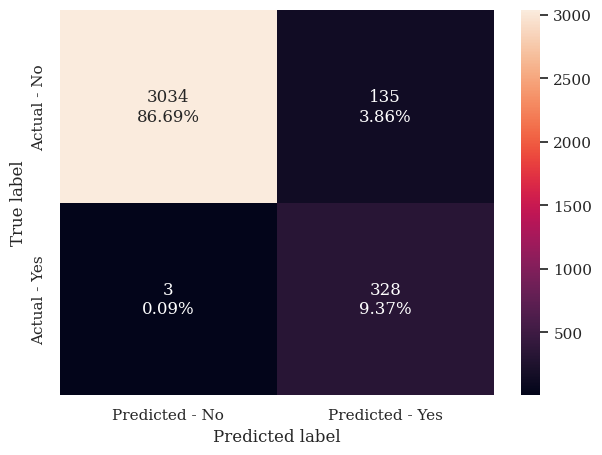

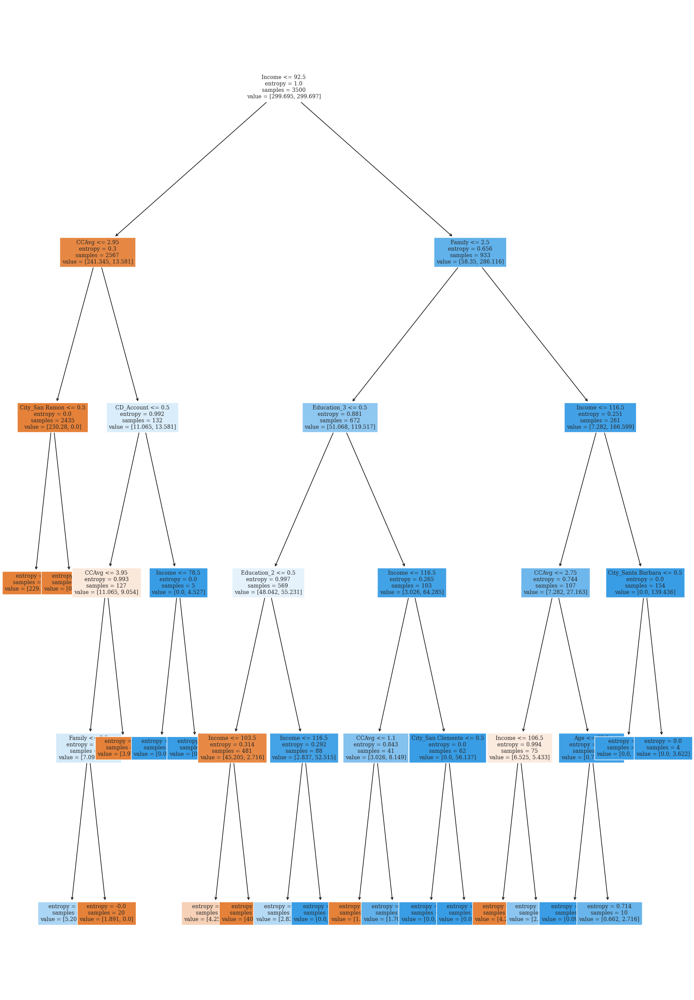

The features importances:
                             Imp
Income              6.223074e-01
Education_2         1.290846e-01
CCAvg               1.222266e-01
Family              6.252944e-02
Education_3         5.306941e-02
CD_Account          8.076151e-03
Age                 2.706337e-03
City_Santa Barbara  4.422189e-16
City_San Ramon      3.805364e-16
City_San Clemente   1.456660e-16


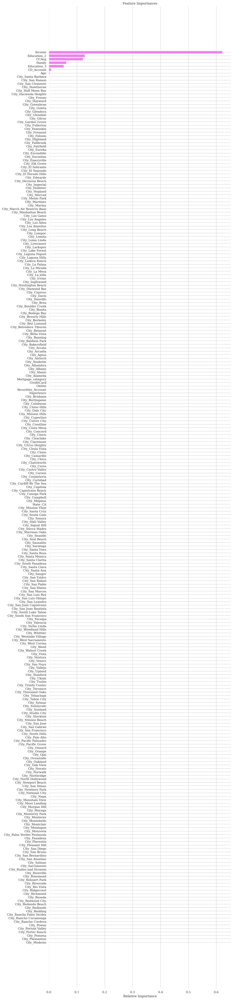

<IPython.core.display.Javascript object>

In [ ]:
make_confusion_matrix(tree_1, X_train, y_train)
plot_tree(tree_1,X_train)
view_feature_importance(tree_1, X_train)

**Observation** \
At max_depth=5, criterion= entropy and default values for the remaining hyperparameters, \
the model performance on the Test data set is better than at at max_depth= None and criterion = gini

* Recall values:
  * Recall for Tree_1 on Train Data = 0.9909365558912386
  * Recall for Tree_1 on Test Data = 0.9530201342281879
* Features with max importance:
  * Income
  * Education_2
* Less importance
  * CCAvg
  * Family
  * Education_3
* Confusion Matrix: - FN at 0.09% - FP at 3.86%



#### **Tuned hyperparamaters to derive Tree_2**

In [ ]:
tree_2 = DecisionTreeClassifier(random_state=1,max_depth=5, criterion='entropy'
                             , class_weight={0: 0.094571, 1: 0.905429},max_leaf_nodes=3,
                       min_impurity_decrease=1e-05)


<IPython.core.display.Javascript object>

In [ ]:
tree_2.fit(X_train,y_train)

DecisionTreeClassifier(class_weight={0: 0.094571, 1: 0.905429},
                       criterion='entropy', max_depth=5, max_leaf_nodes=3,
                       min_impurity_decrease=1e-05, random_state=1)

<IPython.core.display.Javascript object>

##### Model Performance Evaluation Pre-pruned Tree_2

In [ ]:
Recall_Train_TR_2 = get_recall_score(tree_2, X_train, y_train)
print(f'Recall for Tree_2 on Train Data = {Recall_Train_TR_2}')
Recall_Test_TR_2 = get_recall_score(tree_2, X_test, y_test)
print(f'Recall for Tree_2 on Test Data = {Recall_Test_TR_2}')

Recall for Tree_2 on Train Data = 1.0
Recall for Tree_2 on Test Data = 1.0


<IPython.core.display.Javascript object>

In [ ]:
tree_2_model_train_performance = model_performance_classification_sklearn_with_threshold(tree_2,X_train,y_train)
tree_2_model_train_performance

,Accuracy,Recall,Precision,F1
0,0.790286,1.0,0.310798,0.474212


<IPython.core.display.Javascript object>

In [ ]:
tree_2_model_test_performance = model_performance_classification_sklearn_with_threshold(tree_2,X_test,y_test)
tree_2_model_test_performance

,Accuracy,Recall,Precision,F1
0,0.779333,1.0,0.310417,0.473768


<IPython.core.display.Javascript object>

The model seems to overfit the test data

### 2. Post Prunning

In [ ]:
#defining the classifier
PP_tree_0 = DecisionTreeClassifier(random_state=1, class_weight={0: 0.094571, 1: 0.905429})

#defining the cost complexity pryning path
path = PP_tree_0.cost_complexity_pruning_path(X_train, y_train)

#Extracting the ccp_aplhas and impurities from the path
ccp_alphas, impurities = path.ccp_alphas, path.impurities

<IPython.core.display.Javascript object>

In [ ]:
#displaying the ccp_alphas VS the impurities -  alphase increas the impurities increase
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.000000e+00,-2.921116e-16
1,1.156114e-18,-2.909555e-16
2,1.156114e-18,-2.897993e-16
3,1.471418e-18,-2.883279e-16
4,1.541486e-18,-2.867864e-16
5,1.576520e-18,-2.852099e-16
6,2.102026e-18,-2.831079e-16
7,2.452364e-18,-2.806555e-16
8,8.670859e-18,-2.719847e-16
9,8.863544e-18,-2.631211e-16


<IPython.core.display.Javascript object>

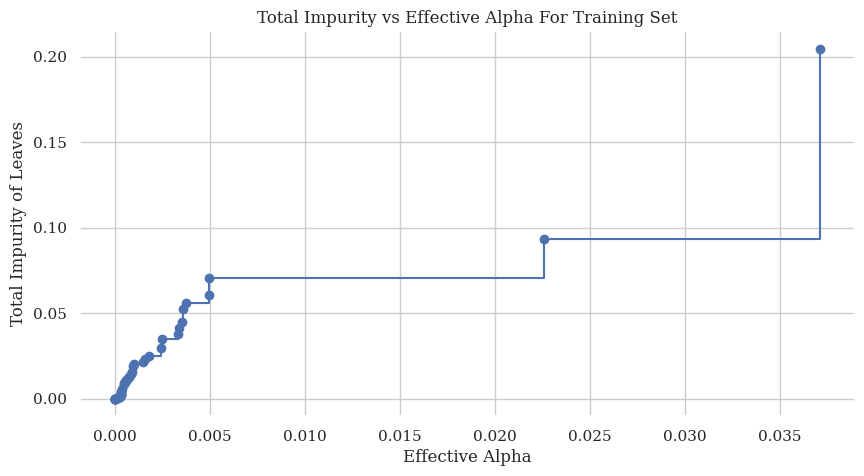

<IPython.core.display.Javascript object>

In [ ]:
#plot the alphas VS the impurities
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("Effective Alpha")
ax.set_ylabel("Total Impurity of Leaves")
ax.set_title("Total Impurity vs Effective Alpha For Training Set")
plt.show()

The key observation is that the total impurity initially decreases as the effective alpha increases, but then starts to peak or increase again after a certain point, approx 0.003

Let us start training the decision tree using the effective alphas and observe how the tree depth vary with alpha

In [ ]:
PP_trees = []
for alpha in ccp_alphas:
    PP_tree = DecisionTreeClassifier(
        random_state=1, ccp_alpha=alpha, class_weight={0: 0.094571, 1: 0.905429}
    )
    PP_tree.fit(X_train, y_train)
    PP_trees.append(PP_tree)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        PP_trees[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.29537944766582247


<IPython.core.display.Javascript object>

* Need to remove the last elements in PP_trees and CCP_alphas as they relfect the smallest tree (one node)
* Proceed with the visualtization of the nodes and depth (i.e tree complexity) as alpha varies

In [ ]:
PP_trees = PP_trees[:-1]
ccp_alphas = ccp_alphas[:-1]

<IPython.core.display.Javascript object>

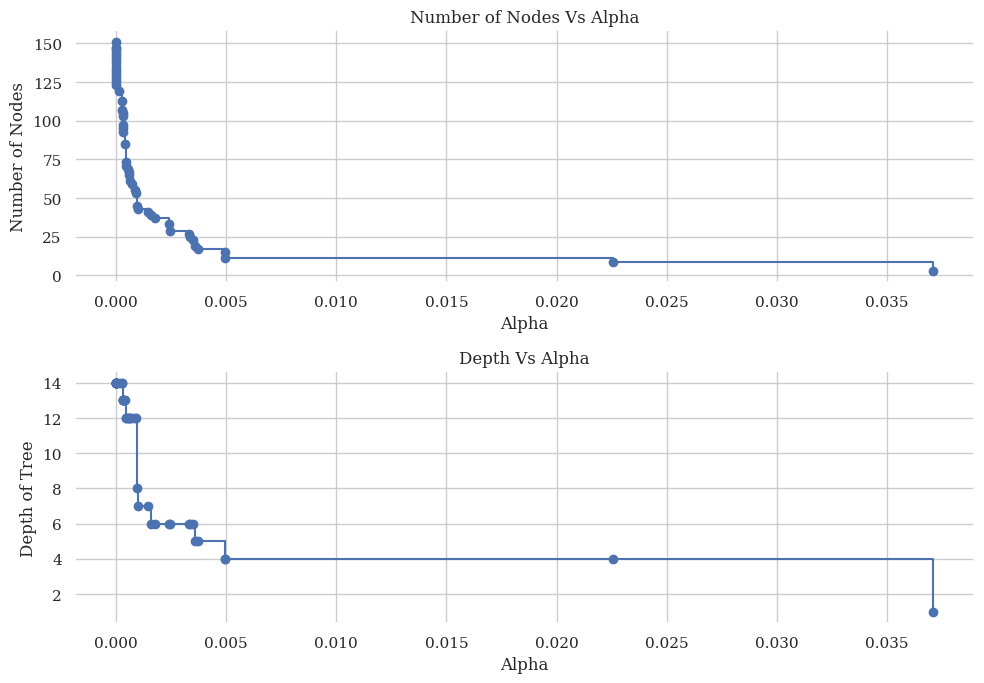

<IPython.core.display.Javascript object>

In [ ]:
node_counts = [PP_tree.tree_.node_count for PP_tree in PP_trees]
depth = [PP_tree.tree_.max_depth for PP_tree in PP_trees]
fig, ax = plt.subplots(2, 1, figsize=(10, 7))
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("Alpha")
ax[0].set_ylabel("Number of Nodes")
ax[0].set_title("Number of Nodes Vs Alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("Alpha")
ax[1].set_ylabel("Depth of Tree")
ax[1].set_title("Depth Vs Alpha")
fig.tight_layout()

* It is observed that at alpha = 0.005 the tree have reached the smallest size which is underfitting the data.
* So it gives an idea that the alpha value that will give us the optimum model performance is definitely below 0.05

Now, observe the Model recall values at varying alphas for the training and test sets

In [ ]:
#recall values for all PP_tress for the train set
recall_train = []
for PP_tree in PP_trees:
    y_pred_train = PP_tree.predict(X_train)
    values_train = recall_score(y_train, y_pred_train)
    recall_train.append(values_train)

<IPython.core.display.Javascript object>

In [ ]:
#recall values for all PP_tress for the test set
recall_test = []
for PP_tree in PP_trees:
    y_pred_test = PP_tree.predict(X_test)
    values_test = recall_score(y_test, y_pred_test)
    recall_test.append(values_test)

<IPython.core.display.Javascript object>

In [ ]:
#calculating the Accuracy of test and train models
train_scores = [PP_tree.score(X_train, y_train) for PP_tree in PP_trees]
test_scores = [PP_tree.score(X_test, y_test) for PP_tree in PP_trees]

<IPython.core.display.Javascript object>

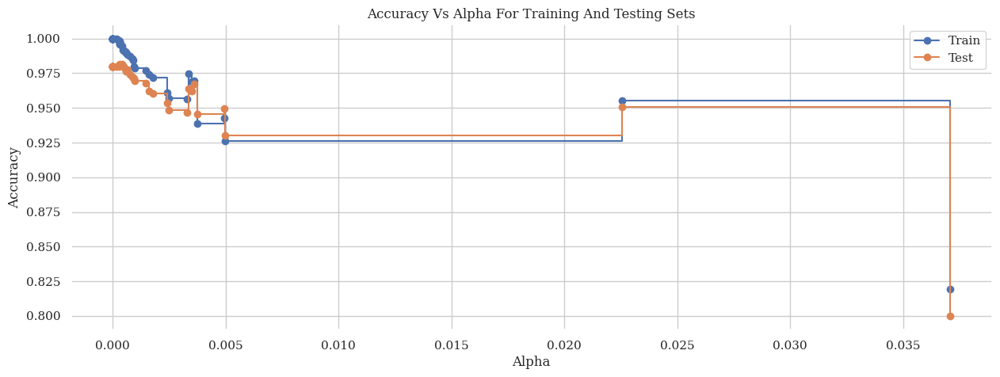

<IPython.core.display.Javascript object>

In [ ]:
#plotting the accuracy for test and training sets
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("Alpha")
ax.set_ylabel("Accuracy")
ax.set_title("Accuracy Vs Alpha For Training And Testing Sets")
ax.plot(
    ccp_alphas, train_scores, marker="o", label="Train", drawstyle="steps-post",
)
ax.plot(ccp_alphas, test_scores, marker="o", label="Test", drawstyle="steps-post")
ax.legend()
plt.show()

It is observe that,
* A better performance at alpha less than 0.05.
* Visually the value of alpha giving the better accuracy is either very close to zero which could be still reflecting an over fitting tree.
* The other option is at approx 0.03 or 0.035.
* The accuracy is not the optimum performance measure
* The best Recall value as a performance measure

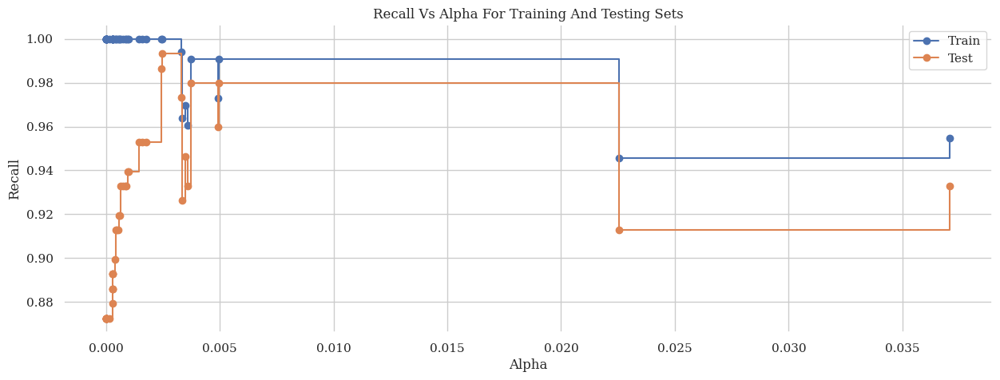

<IPython.core.display.Javascript object>

In [ ]:
#plotting the recall scores for test and training sets VS Alpha
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("Alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall Vs Alpha For Training And Testing Sets")
ax.plot(
    ccp_alphas, recall_train, marker="o", label="Train", drawstyle="steps-post",
)
ax.plot(ccp_alphas, recall_test, marker="o", label="Test", drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
#the minimum alpha value for the test set
index_best_model = np.argmax(recall_test)
print(f''' The best predictibility model recall value is: {recall_test[index_best_model]}
The best alpha value is: {ccp_alphas[index_best_model]}''')

 The best predictibility model recall value is: 0.9932885906040269
The best alpha value is: 0.002472652743953577


<IPython.core.display.Javascript object>

The best model **PP_tree** and fitting it to the train set

#### Model Performance Evaluation Post-pruned Tree

#### Model performance Evaluation of PP_tree_1

In [ ]:
PP_tree_1 = PP_trees[index_best_model]
PP_tree_1.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.002472652743953577,
                       class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

<IPython.core.display.Javascript object>

In [ ]:
#Calculating the Recall for train and test data
Recall_Train_PP_tree_1 = get_recall_score(PP_tree_1, X_train, y_train)
print(f'Recall for PP_t_best_1 on Train Data = {Recall_Train_PP_tree_1}')

Recall_Test_PP_tree_1 = get_recall_score(PP_tree_1, X_test, y_test)
print(f'Recall for PP_t_best_1 on Test Data = {Recall_Test_PP_tree_1}')

Recall for PP_t_best_1 on Train Data = 1.0
Recall for PP_t_best_1 on Test Data = 0.9932885906040269


<IPython.core.display.Javascript object>

In [ ]:
PP_tree_1_model_train_performance = model_performance_classification_sklearn_with_threshold(PP_tree_1,X_train,y_train)
PP_tree_1_model_train_performance

,Accuracy,Recall,Precision,F1
0,0.956857,1.0,0.686722,0.814268


<IPython.core.display.Javascript object>

In [ ]:
PP_tree_1_model_test_performance = model_performance_classification_sklearn_with_threshold(PP_tree_1,X_test,y_test)
PP_tree_1_model_test_performance

,Accuracy,Recall,Precision,F1
0,0.948667,0.993289,0.660714,0.793566


<IPython.core.display.Javascript object>

* The Recall on train data sets is 1.0 which overfitting the model, yet its value is closer to the recall of the test dataset which is still better than Tree_0, and requires more improvement.
* Plot the tree, decision table and feature importantce for this model PP_tree_1 and then derive another model of the second peak of alpha.

In [ ]:
print(f'The tree depth is : {PP_tree_1.tree_.max_depth}')

The tree depth is : 6


<IPython.core.display.Javascript object>

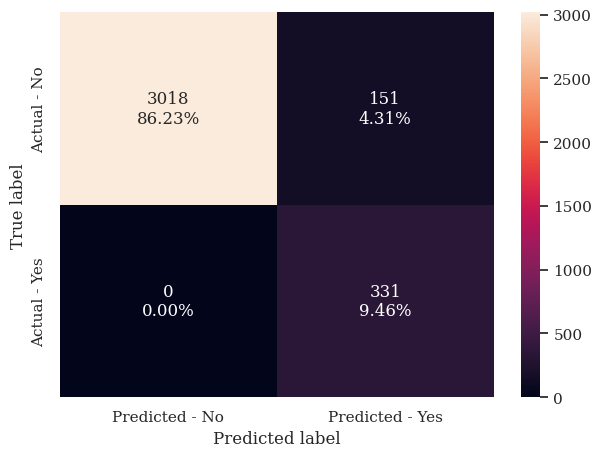

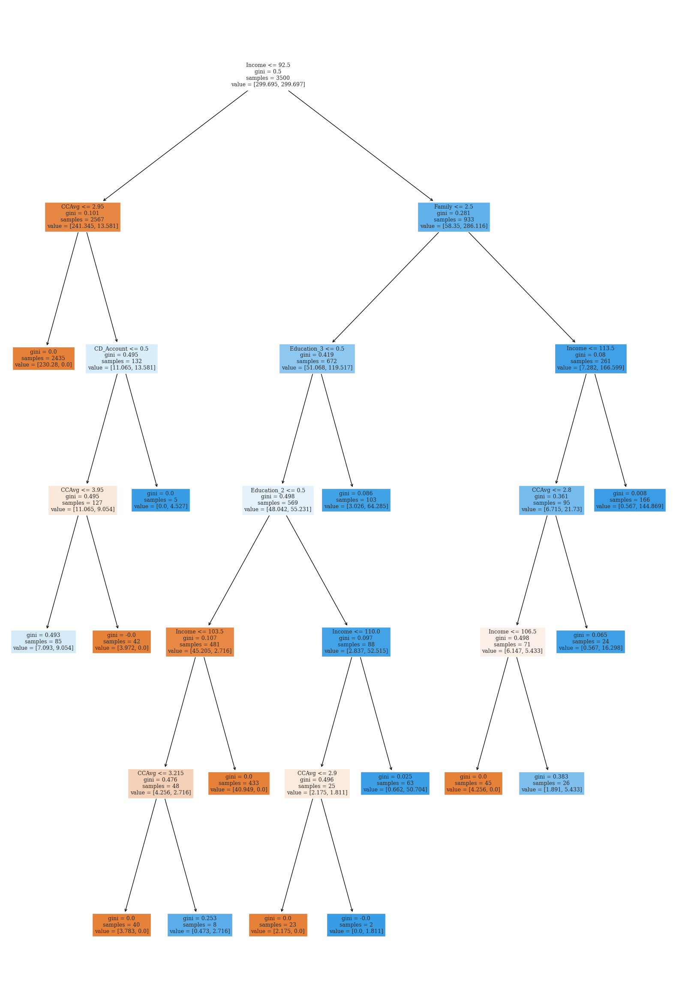

The features importances:
                      Imp
Income           0.668840
Education_2      0.146614
CCAvg            0.083952
Education_3      0.051622
Family           0.040953
CD_Account       0.008018
City_Redlands    0.000000
City_Rio Vista   0.000000
City_Ridgecrest  0.000000
City_Richmond    0.000000


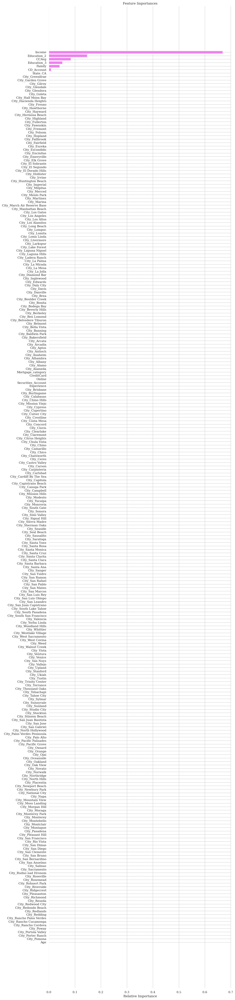

<IPython.core.display.Javascript object>

In [ ]:
make_confusion_matrix(PP_tree_1, X_train, y_train)
plot_tree(PP_tree_1,X_train)
view_feature_importance(PP_tree_1, X_train)

**Observation on PP_tree_1 Model** \
At ccp_alpha=0.00247265274395358 and max_depth=6 the performance summary is:
* Recall values:
  * Recall for PP_tree_1 on Train Data = 1.0
  * Recall for PP_tree_1 on Test Data = 0.9932885906040269
* Features with max importance:
  * Income
  * Education_2
* Less importance:
  * CCAvg
  * Education_3
  * Family

* Confusion matrix:
  * FN at 0.00% (Not realistic)
  * FP at 4.31%

#### Model performance Evaluation of PP_tree_2

In [ ]:
#creating a data frame including alpha, recall train and recall test
df = pd.DataFrame()
df[['ccp_alphas', 'recall_train', 'recall_test']]=''
df['ccp_alphas']=ccp_alphas
df['recall_train']= recall_train
df['recall_test']=recall_test
df

,ccp_alphas,recall_train,recall_test
0,0.000000e+00,1.000000,0.872483
1,1.156114e-18,1.000000,0.872483
2,1.156114e-18,1.000000,0.872483
3,1.471418e-18,1.000000,0.872483
4,1.541486e-18,1.000000,0.872483
5,1.576520e-18,1.000000,0.872483
6,2.102026e-18,1.000000,0.872483
7,2.452364e-18,1.000000,0.872483
8,8.670859e-18,1.000000,0.872483
9,8.863544e-18,1.000000,0.872483


<IPython.core.display.Javascript object>

* At row 42 it is noticed good recall values for train and test sets at a value of alpha near the 0.003.
* This value seems a good fit as it is not too close to an underfitting model
* Extract this value and observe how it behaves on the tree and confusion matrix

In [ ]:
df.iloc[42]

ccp_alphas      0.003504
recall_train    0.969789
recall_test     0.946309
Name: 42, dtype: float64

<IPython.core.display.Javascript object>

In [ ]:
#extracting the model from the 42nd model and fitting it to train and test data
PP_tree_2 = PP_trees[42]
PP_tree_2.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.003503778647096268,
                       class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

<IPython.core.display.Javascript object>

In [ ]:
#Calculating the Recall for train and test data
Recall_Train_PP_tree_2 = get_recall_score(PP_tree_2, X_train, y_train)
print(f'Recall for PP_tree_2 on Train Data = {Recall_Train_PP_tree_2}')

Recall_Test_PP_tree_2 = get_recall_score(PP_tree_2, X_test, y_test)
print(f'Recall for PP_tree_1 on Test Data = {get_recall_score(PP_tree_2, X_test, y_test)}')

Recall for PP_tree_2 on Train Data = 0.9697885196374623
Recall for PP_tree_1 on Test Data = 0.9463087248322147


<IPython.core.display.Javascript object>

In [ ]:
PP_tree_2_model_train_performance = model_performance_classification_sklearn_with_threshold(PP_tree_2,X_train,y_train)
PP_tree_2_model_train_performance

,Accuracy,Recall,Precision,F1
0,0.968857,0.969789,0.764286,0.85486


<IPython.core.display.Javascript object>

In [ ]:
PP_tree_2_model_test_performance = model_performance_classification_sklearn_with_threshold(PP_tree_2,X_test,y_test)
PP_tree_2_model_test_performance

,Accuracy,Recall,Precision,F1
0,0.962,0.946309,0.742105,0.831858


<IPython.core.display.Javascript object>

* The Recall on test and train data sets are the same as stated in the dataframe df as expected
* Now Plot the tree, the confusion matrix and feature importance

In [ ]:
print(f'The tree depth is : {PP_tree_2.tree_.max_depth}')

The tree depth is : 6


<IPython.core.display.Javascript object>

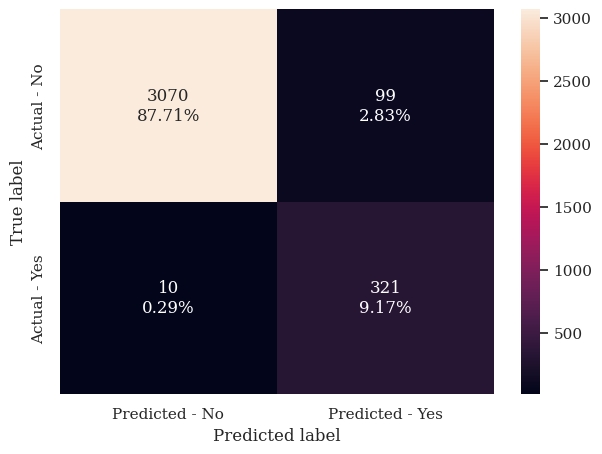

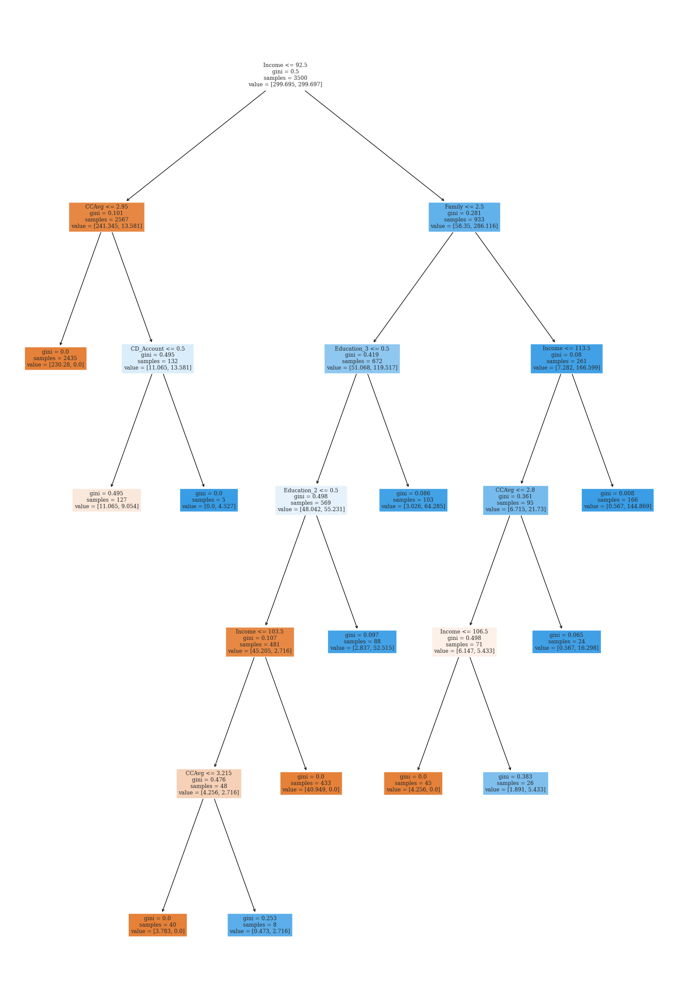

The features importances:
                      Imp
Income           0.676053
Education_2      0.149883
CCAvg            0.071228
Education_3      0.052773
Family           0.041866
CD_Account       0.008197
City_Redlands    0.000000
City_Rio Vista   0.000000
City_Ridgecrest  0.000000
City_Richmond    0.000000


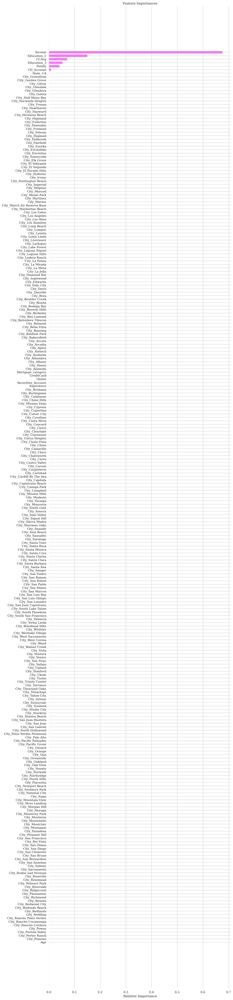

<IPython.core.display.Javascript object>

In [ ]:
make_confusion_matrix(PP_tree_2, X_train, y_train)
plot_tree(PP_tree_2,X_train)
view_feature_importance(PP_tree_2, X_train)

**Observation on PP_tree_2 Model**

* At ccp_alpha=0.003504 and max_depth=6 the performance of PP_tree_2 is better then PP_tree_1.
* The recall values for train and test are less

* The performance summary is:
  * Recall values:
    * Recall for PP_tree_2 on Train Data = 0.9697885196374623
    * Recall for PP_tree_2 on Test Data = 0.9463087248322147
  * Features with max importance:
    * Income: 0.676053
    * Education_2: 0.149883
  * Less importance :
    * CCAvg: 0.071228
    * Education_3: 0.052773
    * Family: 0.041866
  * Confusion matrix:
    * FN at 0.29%
    * FP at 2.83%


#### Model performance Evaluation of PP_tree_3

In [ ]:
df.iloc[44]

ccp_alphas      0.003730
recall_train    0.990937
recall_test     0.979866
Name: 44, dtype: float64

<IPython.core.display.Javascript object>

In [ ]:
#extracting the model from the 42nd model and fitting it to train and test data
PP_tree_3 = PP_trees[44]
PP_tree_3.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0037296801618502927,
                       class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

<IPython.core.display.Javascript object>

In [ ]:
#Calculating the Recall for train and test data
Recall_Train_PP_tree_3 = get_recall_score(PP_tree_3, X_train, y_train)
print(f'Recall for PP_tree_3 on Train Data = {Recall_Train_PP_tree_3}')
Recall_Test_PP_tree_3 = get_recall_score(PP_tree_3, X_test, y_test)
print(f'Recall for PP_tree_3 on Test Data = {Recall_Test_PP_tree_3}')

Recall for PP_tree_3 on Train Data = 0.9909365558912386
Recall for PP_tree_3 on Test Data = 0.9798657718120806


<IPython.core.display.Javascript object>

In [ ]:
PP_tree_3_model_train_performance = model_performance_classification_sklearn_with_threshold(PP_tree_3,X_train,y_train)
PP_tree_3_model_train_performance

,Accuracy,Recall,Precision,F1
0,0.938857,0.990937,0.608534,0.754023


<IPython.core.display.Javascript object>

In [ ]:
PP_tree_3_model_test_performance = model_performance_classification_sklearn_with_threshold(PP_tree_3,X_test,y_test)
PP_tree_3_model_test_performance

,Accuracy,Recall,Precision,F1
0,0.945333,0.979866,0.648889,0.780749


<IPython.core.display.Javascript object>

The Recall on test and train data sets are the almost same as stated in the dataframe df which was expected

In [ ]:
print(f'The tree depth is : {PP_tree_3.tree_.max_depth}')

The tree depth is : 5


<IPython.core.display.Javascript object>

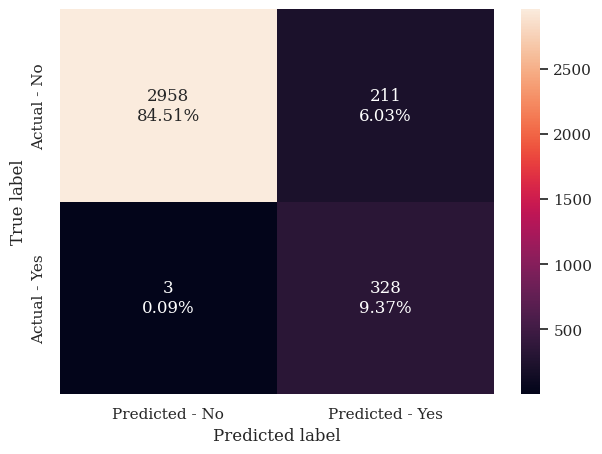

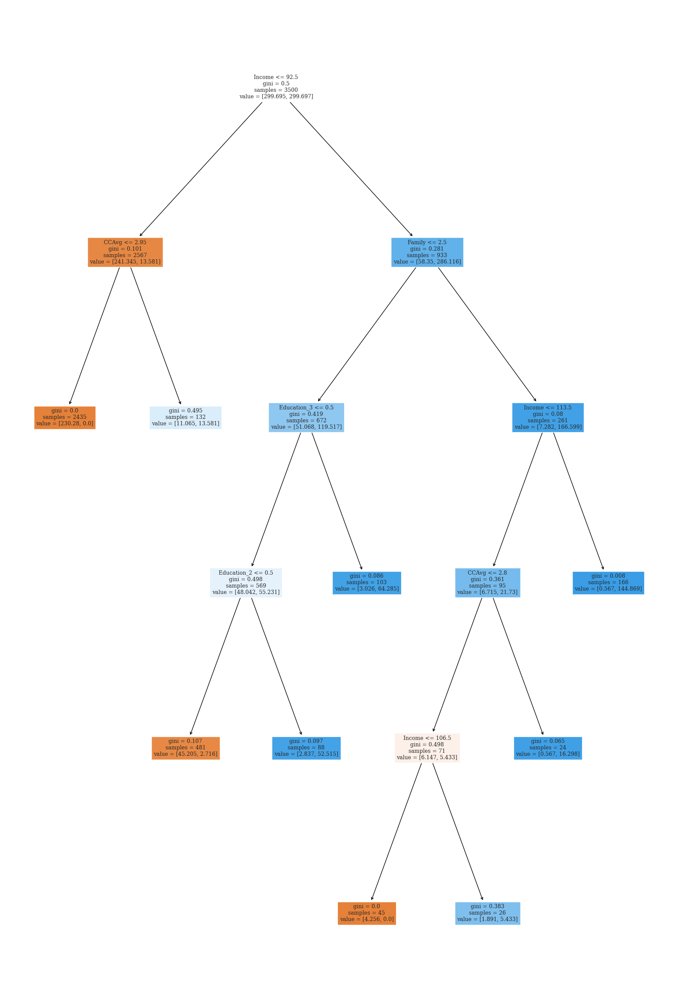

The features importances:
                      Imp
Income           0.685906
Education_2      0.153574
CCAvg            0.063550
Education_3      0.054072
Family           0.042897
City_Redlands    0.000000
City_Rio Vista   0.000000
City_Ridgecrest  0.000000
City_Richmond    0.000000
City_Reseda      0.000000


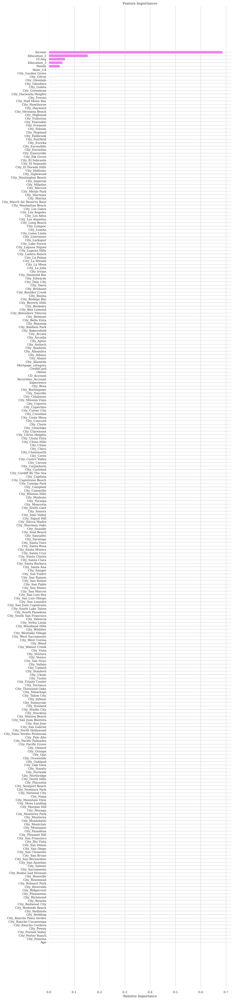

<IPython.core.display.Javascript object>

In [ ]:
make_confusion_matrix(PP_tree_3, X_train, y_train)
plot_tree(PP_tree_3,X_train)
view_feature_importance(PP_tree_3, X_train)

**Observation on PP_tree_3 Model**
* At ccp_alpha=0.0.003730 and max_depth=5 the performance of PP_tree_3 is better then PP_t_best_2. Although the recall values for train and test are less, the FN% in the confusion matrix is down to half. The performance summary is:

* Recall values:
  * Recall for PP_tree_3 on Train Data = 0.9909365558912386
  * Recall for PP_tree_3 on Test Data = 0.9798657718120806
* Features with max importance:
  * Income: 0.685906
  * Education_2: 0.153574
* Less importance yet still having a predictibily effect:
  * CCAvg: 0.063550
  * Education_3: 0.054072
  * Family: 0.042897
* Confusion matrix:
  * FN at 0.09%
  * FP at 6.03%


## Model Comparison and Final Model Selection

### Decision Tree Models Comparison (pre-pruning)

In [ ]:
df_perf = pd.DataFrame(
        {
            "Accuracy": "",
            "Recall": "",
            "Precision": "",
            "F1":""

        },
        index=[0],
    )

models_test_comp_df = pd.concat(
    [
        df_perf.T,
        tree_0_model_train_performance.T,
        t_grid_model_train_performance.T,
        tree_1_model_train_performance.T,
        tree_2_model_train_performance.T,
        df_perf.T,
        tree_0_model_test_performance.T,
        t_grid_model_test_performance.T,
        tree_1_model_test_performance.T,
        tree_2_model_test_performance.T,
    ],
    axis=1,
)

models_test_comp_df.columns = [
    "Train Data Model Name",
    "tree_0",
    "t_grid",
    "tree_1",
    "tree_2",
    "Test Data Model Name",
    "tree_0",
    "t_grid",
    "tree_1",
    "tree_2",

]
print("Train and Test performance comparison:")

models_test_comp_df.T



Train and Test performance comparison:


,Accuracy,Recall,Precision,F1
Train Data Model Name,,,,
tree_0,1.0,1.0,1.0,1.0
t_grid,0.790286,1.0,0.310798,0.474212
tree_1,0.960571,0.990937,0.708423,0.826196
tree_2,0.790286,1.0,0.310798,0.474212
Test Data Model Name,,,,
tree_0,0.98,0.872483,0.921986,0.896552
t_grid,0.779333,1.0,0.310417,0.473768
tree_1,0.958667,0.95302,0.720812,0.820809
tree_2,0.779333,1.0,0.310417,0.473768


<IPython.core.display.Javascript object>

* The best performing model on the test set is tree_1 with the below hyperparameters:

  * ccp_alpha = 0.003503778647096268
  * class_weight = {0: 0.094571, 1: 0.905429}
  * random_state = 1

* The feature importance of this model is:
  * Features with max importance:
    * Income: 6.223074e-01
    * Education_2: 1.290846e-01
  * Less importance :
    * CCAvg: 1.222266e-01
    * Family: 6.252944e-02
    * Education_3: 5.306941e-02


   

### Decision Tree Models Comparison (post-pruning)

In [ ]:
df_pp = pd.DataFrame(
        {
            "Accuracy": "",
            "Recall": "",
            "Precision": "",
            "F1":""

        },
        index=[0],
    )

PP_models_test_comp_df = pd.concat(
    [
        df_pp.T,
        PP_tree_1_model_train_performance.T,
        PP_tree_2_model_train_performance.T,
        PP_tree_3_model_train_performance.T,

        df_pp.T,
        PP_tree_1_model_test_performance.T,
        PP_tree_2_model_test_performance.T,
        PP_tree_3_model_test_performance.T,

    ],
    axis=1,
)

PP_models_test_comp_df.columns = [
    "Train Data Model Name",
    "PP_tree_1",
    "PP_tree_2",
    "PP_tree_3",

    "Test Data Model Name",
    "PP_tree_1",
    "PP_tree_2",
    "PP_tree_3",


]
print("Train and Test performance comparison:")

PP_models_test_comp_df.T

Train and Test performance comparison:


,Accuracy,Recall,Precision,F1
Train Data Model Name,,,,
PP_tree_1,0.956857,1.0,0.686722,0.814268
PP_tree_2,0.968857,0.969789,0.764286,0.85486
PP_tree_3,0.938857,0.990937,0.608534,0.754023
Test Data Model Name,,,,
PP_tree_1,0.948667,0.993289,0.660714,0.793566
PP_tree_2,0.962,0.946309,0.742105,0.831858
PP_tree_3,0.945333,0.979866,0.648889,0.780749


<IPython.core.display.Javascript object>

* The third model has a low tree depth of 5
* So less tree complexity of the tree using a greater value of alpha
* So it was successful in avoiding the model overfitting.
* The best performing model on the test set is PP_tree_3 with ccp_alpha	0.003730

* Feature Importance:

  * Features with max importance:
    * Income:  0.685906
    * Education_2:  0.153574
  * Less importance:
    * CCAvg:  0.063550
    * Education_3:  0.054072
    * Family:  0.042897

## Actionable Insights and Business Recommendations


* What recommedations would you suggest to the bank?

* To continually enhance the services and engage more effectively with the customers, I would like to propose the following recommendations based on our analysis of key features that influence personal loan acceptance:

  * **Target Higher Income Segments:**

    * **Insight:** The analysis indicates a correlation between income and the likelihood of accepting a personal loan.
    * **Recommendation:** Focus marketing efforts on segments with higher income levels, tailoring promotions and communication to address the financial needs and preferences of this demographic.
  * **Leverage Education Level 2:**

    * **Insight:** Customers with Education Level 2 show a higher inclination towards accepting personal loans compared to Levels 1 and 3.
    * **Recommendation:** Design targeted campaigns and educational materials that resonate with individuals at Education Level-2, emphasizing the benefits and value of our personal loan offerings.
  * **Promote Higher Monthly Spending (CCAvg):**

    * **Insight:** There is a positive correlation between monthly spending (CCAvg) and the likelihood of accepting a personal loan.
    * **Recommendation:** Encourage customers to explore personal loan options that align with their lifestyle and financial aspirations. Consider promotional offers that reward increased spending with exclusive loan benefits.
  * **Engage Customers with Education Level 3:**

    * **Insight:** Customers with Education Level 3 exhibit a higher willingness to accept personal loans compared to Level 1.
    * **Recommendation:** Implement targeted communication strategies and educational initiatives to connect with customers at Education Level 3, highlighting the advantages of our personal loan products.
  * **Focus on Family-Oriented Campaigns:**

    * **Insight:** There is a positive correlation between family size and the likelihood of accepting a personal loan.
    * **Recommendation:** Develop campaigns that emphasize the family-oriented benefits of our personal loans, addressing the financial needs and aspirations of customers with larger families.

___